<a href="https://colab.research.google.com/github/InscribeDeeper/AU2Emotion/blob/master/video_preprocessing_v5_gettime_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
use_colab = True
if use_colab:
  !sudo pip install pytesseract
  !sudo apt-get install tesseract-ocr
  import pytesseract
  from google.colab import drive
  drive.mount('/content/drive')
  # import glob
  # video_list = glob.glob("/content/drive/MyDrive/robot/vedioanalysis/orig_vedio/*")
  # output_path = '/content/drive/MyDrive/robot/vedioanalysis/Edited/Edicted_py/'
else:
  pass

In [ ]:
use_colab = True
if use_colab:
  !sudo pip install pytesseract
  !sudo apt-get install tesseract-ocr
  import pytesseract
  from google.colab import drive
  drive.mount('/content/drive')
  # import glob
  # video_list = glob.glob("/content/drive/MyDrive/robot/vedioanalysis/orig_vedio/*")
  # output_path = '/content/drive/MyDrive/robot/vedioanalysis/Edited/Edicted_py/'
else:
  pass

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.00~git2288-10f4998a-2).
0 upgraded, 0 newly installed, 0 to remove and 40 not upgraded.
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import re
import cv2 
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [ ]:
time_tb = pd.read_excel('/content/drive/MyDrive/robot/vedioanalysis/AU2Emotion/IndividalTeamMemberIDs.xlsx',sheet_name = 'Sheet2' )

In [ ]:
time_tb.head()

In [ ]:
import glob

video_list = glob.glob("/content/drive/MyDrive/robot/vedioanalysis/Audio Video/**",recursive=True)
video_list = [v for v in video_list if 'mp4' in v]

In [ ]:
import pickle


In [ ]:
# file = open("result_gettime_1",'r')
# object_file = pickle.load(file)

In [ ]:
#detect the text of a pic of a second 

def process_video_text_all(path,start_time):
    capture = cv2.VideoCapture(path)
    #print(capture.isOpened())
    fps = capture.get(cv2.CAP_PROP_FPS)
    #print(fps)### 获取 1 秒有多少帧
    total_ = capture.get(cv2.CAP_PROP_FRAME_COUNT)
    print('total', total_)
    fourcc = cv2.VideoWriter_fourcc('m','p','4','v')

    discusstion_start = None
    crossword_start = None
    memory_start = None

    detected = 0 # detect discussion
    detected_1 = 0 #detect crossword
    detected_2 = 0 #detect memory
    
    timer = 0
    min_from = 0
    min_from_1 = 0
    min_from_2 = 0
    print_flag = 0
    print_flag_1 = 0
    while(capture.isOpened()):
        timer += 1  ## 开始计算过去了多少帧
        if timer % 10000 ==0:
            print(timer)
            
        ret, frame = capture.read()  ## 逐帧读取视频
        if ret:
            if print_flag == 0:
              print_flag = 1
              print('start')
            ### detect discussion part
            if (detected == 0) & (timer > start_time*60*fps):
                frame_cut = frame[:, ::]  #cut the upper part to detect text
                #detect text
                if timer%14 == 0:
                    gray = cv2.cvtColor(frame_cut, cv2.COLOR_BGR2GRAY) 
                    text = pytesseract.image_to_string(gray).lower()                   

                    if (detected == 0 ) & (("team icebreaker activity" in text) or ("team expertise and knowledge" in text)) : #find discussion part 
                        plt.figure(figsize=(5,5))
                        plt.imshow(frame_cut)
                        plt.show() 
                        detected = 1
                        discusstion_start = capture.get(cv2.CAP_PROP_POS_MSEC)
                        timer_pin = timer # get the time when discussion part start
                        min_from = round(timer_pin/fps/60)                        
                        print('detect discussion: ', discusstion_start/1000)

                    #print('min_from', min_from)
            elif (detected == 0) & (timer > total_/2):
                print('fail detect discussion')
                break


            
            elif (detected == 1) & (detected_1 == 0) & (timer > (min_from+7+1) * fps * 60): #4.5
                frame_cut_1 = frame[:, ::]
                if timer % 14 == 0:
                    gray_1 = cv2.cvtColor(frame_cut_1, cv2.COLOR_BGR2GRAY) 
                    text_1 = pytesseract.image_to_string(gray_1).lower()

                    if (detected_1 == 0 ) & ("across" in text_1) & ('down' in text_1) : #find crosstab part 
                        plt.figure(figsize=(5,5))
                        plt.imshow(frame_cut_1)
                        plt.show() 
                        crossword_start = capture.get(cv2.CAP_PROP_POS_MSEC)
                        detected_1 = 1
                        timer_pin_1 = timer # get the time when crosstab start
                        min_from_1 = round(timer_pin_1/fps/60)
                        print('detect crossword: ', crossword_start/1000)
                        #break

            elif (detected == 1) & (detected_1 == 0) & (timer > total_/2):
                print('fail detect crossword')
                break            
                    
            elif (detected == 1) & (detected_1 == 1) & (detected_2 == 0) & (timer > (min_from_1+25+3) * fps * 60): #3 mins after discussion & corssword part finish, start to detect memory         
                #print('start')
                frame_cut_2 = frame[:, ::]
                if timer % 14 == 0:
                    gray_2 = cv2.cvtColor(frame_cut_2, cv2.COLOR_BGR2GRAY) 
                    text_2 = pytesseract.image_to_string(gray_2).lower() #lang='eng', config='--psm 6'
                    if (detected_2 == 0 ) & ("algebra" in text_2) : #find memory part 
                        plt.figure(figsize=(5,5))
                        plt.imshow(frame_cut_2)
                        plt.show() 
                        detected_2 = 1                        
                        timer_pin_2 = timer # get the time when crosstab start
                        min_from_2 = round(timer_pin_2/fps/60)
                        memory_start = capture.get(cv2.CAP_PROP_POS_MSEC)
                        print('detect memory: ', memory_start/1000)
                        break  


        else:
          print('finish')
          break                        

    if memory_start != None:
      memory_start = memory_start/1000
    if discusstion_start != None:
      discusstion_start = discusstion_start/1000
    if crossword_start != None:       
      crossword_start = crossword_start/1000
    capture.release()  ## 清内存，好习惯
    cv2.destroyAllWindows()
    return [discusstion_start, crossword_start, memory_start]
    

106
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/GAMMA/S12G3C_Webcam_Gamma.mp4
total 42467.0
start


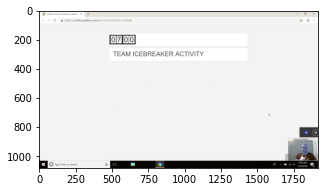

detect discussion:  144.63997395833331
10000


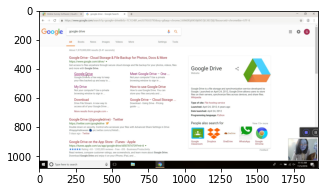

detect crossword:  828.0819498697916
20000
30000


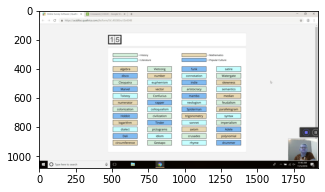

detect memory:  2665.4559733072915
107
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/OMEGA/S12G3C_Webcam_Omega.mp4
total 42287.0
start


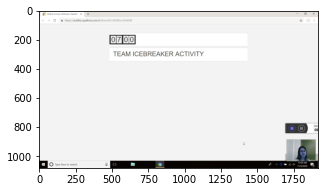

detect discussion:  82.260009765625
10000


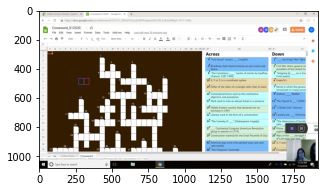

detect crossword:  823.1700032552083
20000
30000


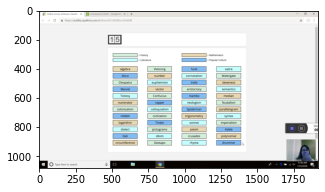

detect memory:  2608.711995442708
108
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 1/ALPHA/S13G1D_WEBCAM_ALPHA.mp4
total 43292.0
start


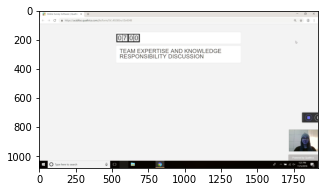

detect discussion:  262.15201822916663
10000


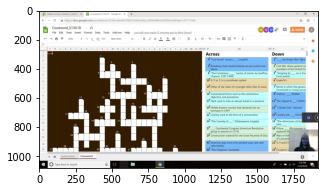

detect crossword:  922.946044921875
20000
30000


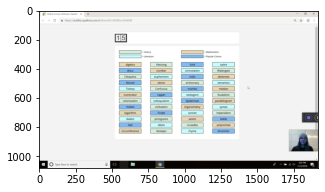

detect memory:  2665.9560546875
109
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 1/BETA/S13G1D_Webcam_Beta.mp4
total 41797.0
start


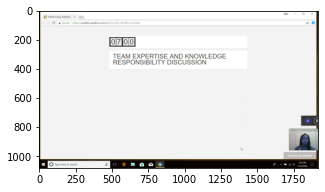

detect discussion:  164.2900390625
10000


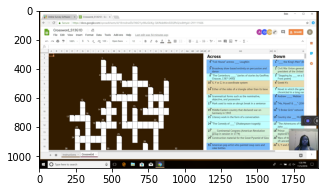

detect crossword:  828.3680013020833
20000
30000


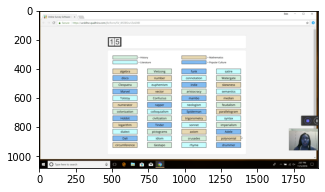

detect memory:  2567.010009765625
110
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 1/GAMMA/S13G1D_Webcam_Gamma.mp4
total 41472.0
start


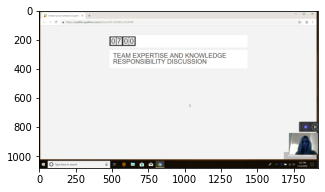

detect discussion:  228.96199544270831
10000


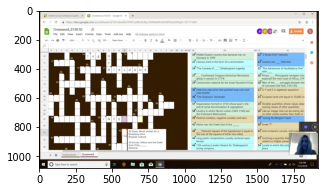

detect crossword:  1036.8579915364583
20000
30000
40000
finish
111
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 1/OMEGA/S13G1D_Webcam_Omega.mp4
total 43487.0
start


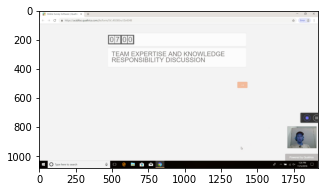

detect discussion:  135.71004231770831
10000


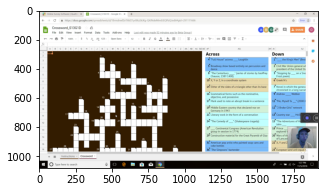

detect crossword:  794.1800130208333
20000
30000


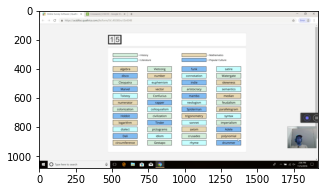

detect memory:  2534.2660319010415
112
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 2/ALPHA/S13G2D_WEBCAM_ALPHA.mp4
total 44333.0
start


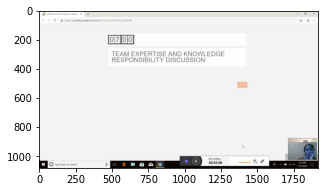

detect discussion:  186.31998697916666
10000


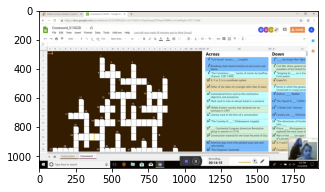

detect crossword:  855.135986328125
20000
30000


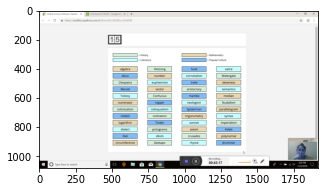

detect memory:  2597.762044270833
113
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 2/BETA/S13G2D_WEBCAM_BETA.mp4
total 41990.0
start


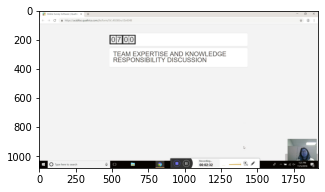

detect discussion:  153.15999348958331
10000


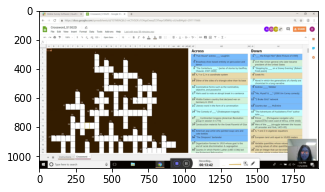

detect crossword:  822.4099934895833
20000
30000


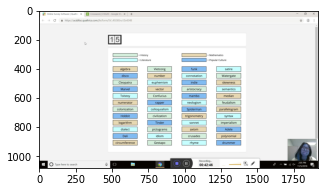

detect memory:  2567.1620279947915
114
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 2/GAMMA/S13G2D_WEBCAM_GAMMA.mp4
total 41618.0
start


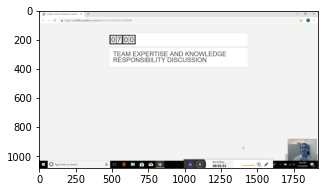

detect discussion:  213.36995442708331
10000


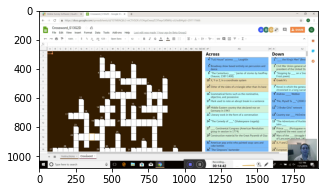

detect crossword:  882.3899739583333
20000
30000


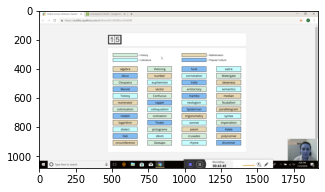

detect memory:  2625.295979817708
115
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 2/OMEGA/S13G2D_WEBCAM_OMEGA.mp4
total 42830.0
start


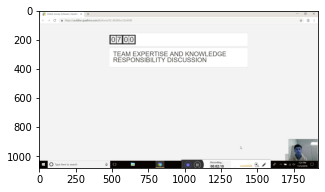

detect discussion:  130.85994466145831
10000


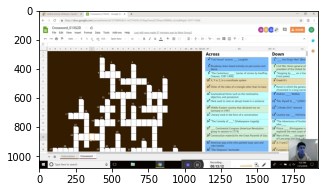

detect crossword:  792.8819986979166
20000
30000


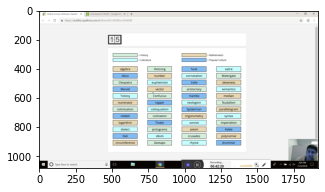

detect memory:  2540.378011067708
116
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/ALPHA/S13G3D_Webcam_Alpha.mp4
total 40035.0
start


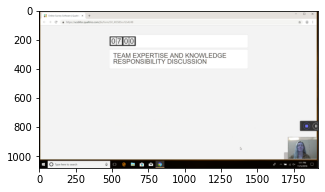

detect discussion:  154.322021484375
10000


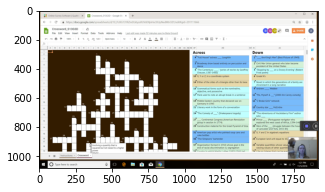

detect crossword:  760.4739583333333
20000
30000


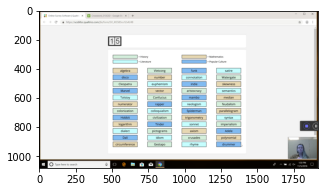

detect memory:  2476.784016927083
117
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/BETA/S13G3D_Webcam_Beta.mp4
total 34424.0
start


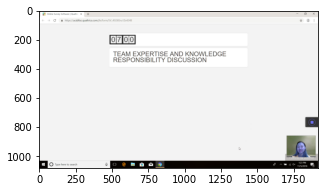

detect discussion:  119.14005533854166
10000


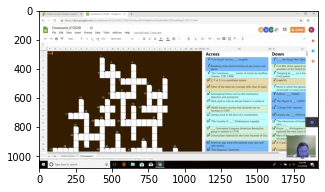

detect crossword:  730.6520182291666
20000
30000
finish
118
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/GAMMA/S13G3D_Webcam_Gamma.mp4
total 39508.0
start


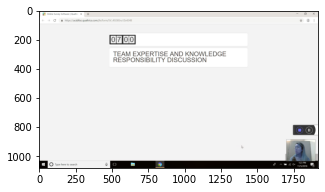

detect discussion:  177.29996744791666
10000


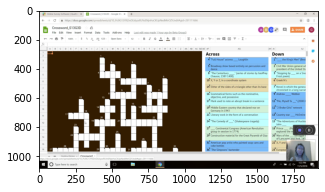

detect crossword:  791.5599772135416
20000
30000


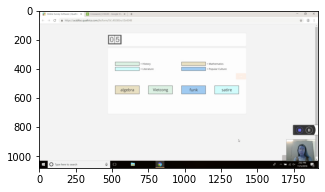

detect memory:  2518.8219401041665
119
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/OMEGA/S13G3D_Webcam_Omega.mp4
total 39595.0
start


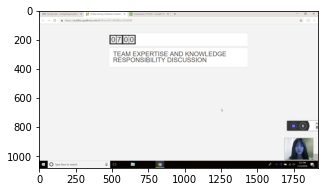

detect discussion:  102.260009765625
10000


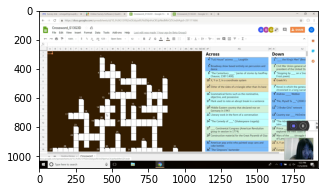

detect crossword:  716.968017578125
20000
30000


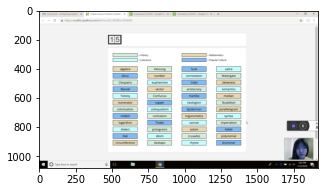

detect memory:  2431.31201171875
120
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 2/ALPHA/S14G2C_WEBCAM_ALPHA.mp4
total 46097.0
start


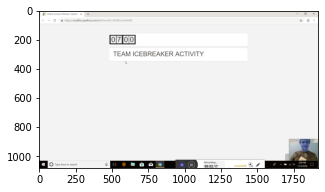

detect discussion:  137.49007161458331
10000


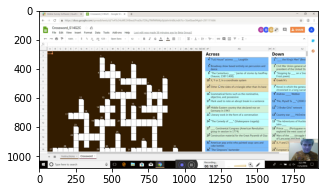

detect crossword:  1017.4180501302083
20000
30000
40000


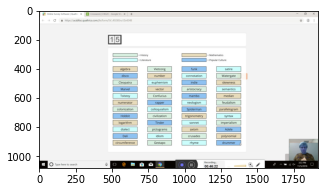

detect memory:  2782.2460123697915
121
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 2/BETA/S14G2C_WEBCAM_BETA.mp4
total 44059.0
start


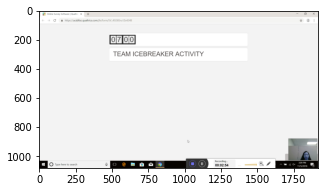

detect discussion:  174.42399088541666
finish
122
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 2/GAMMA/S14G2C_WEBCAM_GAMMA.mp4
total 45011.0
start


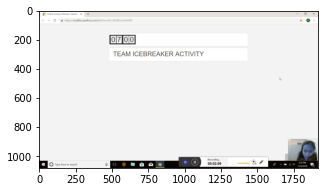

detect discussion:  129.31998697916666
10000


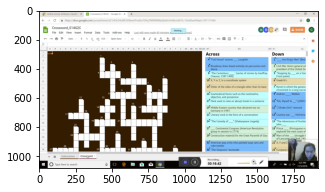

detect crossword:  1002.2439778645833
20000
30000
40000


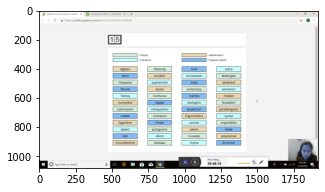

detect memory:  2775.399983723958
123
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 2/OMEGA/S14G2C_WEBCAM_OMEGA.mp4
total 46987.0
start


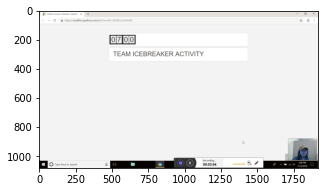

detect discussion:  184.32999674479166
10000


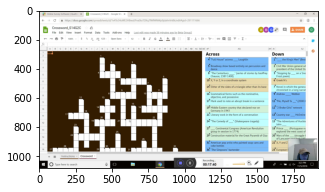

detect crossword:  1060.406005859375
20000
30000
40000


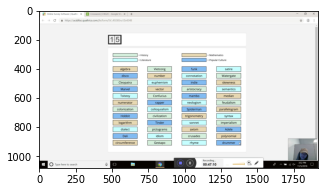

detect memory:  2830.294026692708
124
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/ALPHA/S14G3C_Webcam_Alpha.mp4
total 40388.0
start


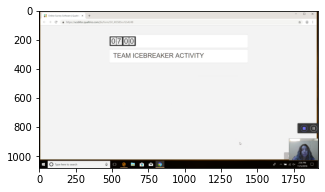

detect discussion:  124.95402018229166
10000


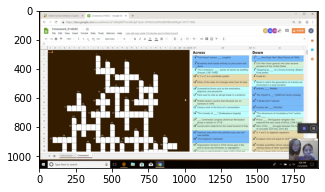

detect crossword:  725.4960123697916
20000
30000


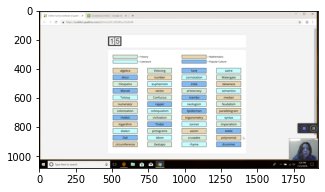

detect memory:  2498.054036458333
125
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/BETA/S14G3C_Webcam_Beta.mp4
total 34283.0
start


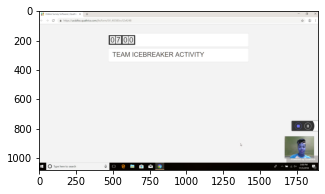

detect discussion:  102.02001953125


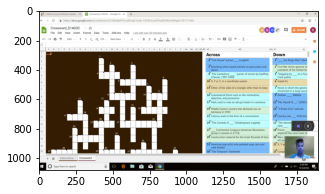

detect crossword:  697.5419921875
10000
20000
30000


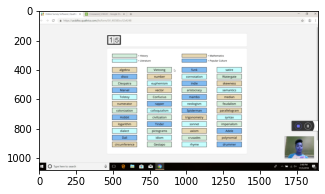

detect memory:  2460.8519694010415
126
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/GAMMA/S14G3C_Webcam_Gamma.mp4
total 39861.0
start


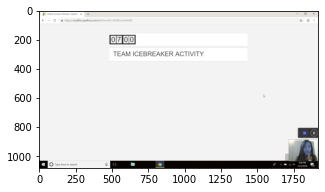

detect discussion:  147.22005208333331
10000


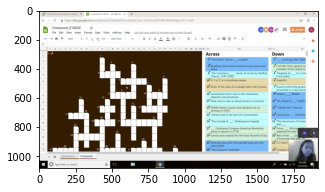

detect crossword:  735.8299967447916
20000
30000


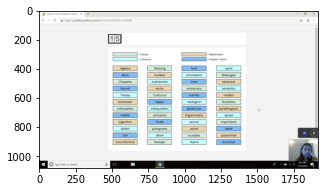

detect memory:  2517.3060709635415
127
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/OMEGA/S14G3C_Webcam_Omega.mp4
total 40004.0
start


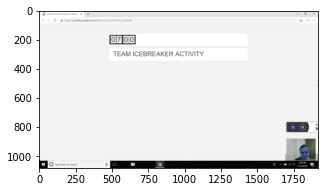

detect discussion:  85.199951171875
10000


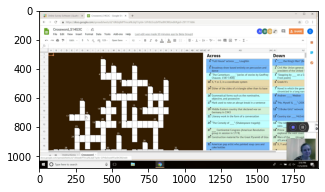

detect crossword:  684.2019856770833
20000
30000


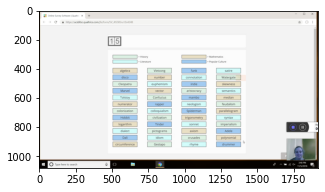

detect memory:  2451.4359537760415
128
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 1/ALPHA/S15G1D_WEBCAM_ALPHA.mp4
total 43552.0
start


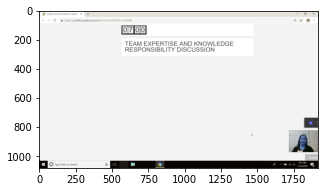

detect discussion:  219.239990234375
10000


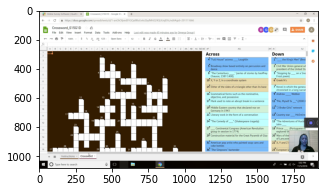

detect crossword:  866.6499837239583
20000
30000


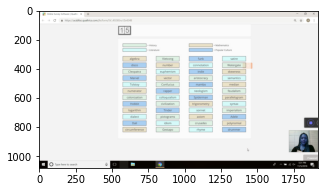

detect memory:  2632.701985677083
129
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 1/BETA/S15G1D_Webcam_Beta.mp4
total 40616.0
start


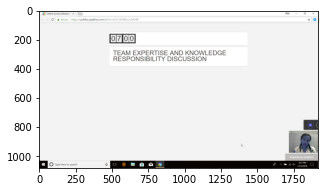

detect discussion:  141.0439453125
10000


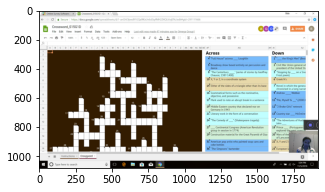

detect crossword:  792.5299479166666
20000
30000


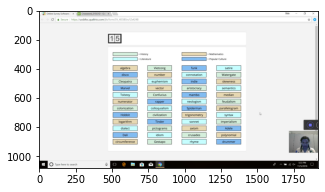

detect memory:  2553.4759928385415
130
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 1/GAMMA/S15G1D_Webcam_Gamma.mp4
total 41997.0
start


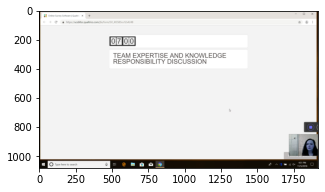

detect discussion:  186.93204752604166
10000


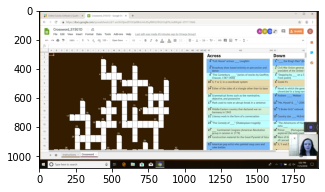

detect crossword:  845.572021484375
20000
30000


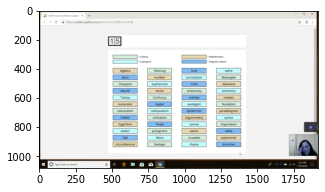

detect memory:  2598.1739908854165
131
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 1/OMEGA/S15G1D_Webcam_Omega.mp4
total 40845.0
start


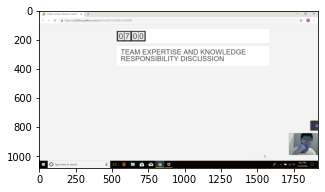

detect discussion:  118.43204752604166
10000


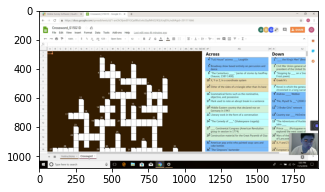

detect crossword:  770.9940592447916
20000
30000


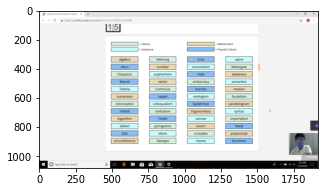

detect memory:  2531.530029296875
132
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/ALPHA/S15G3D_Webcam_Alpha.mp4
total 42534.0
start


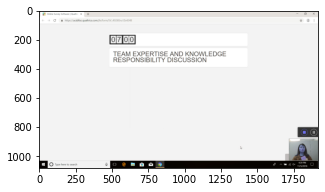

detect discussion:  124.62003580729166
10000


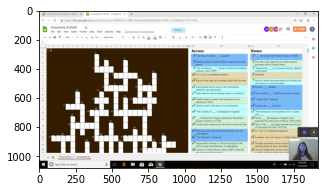

detect crossword:  742.2040201822916
20000
30000


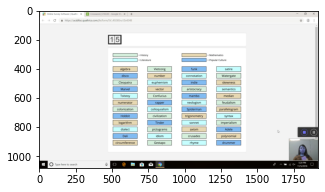

detect memory:  2556.428059895833
133
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/BETA/S15G3D_Webcam_Beta.mp4
total 43399.0
start


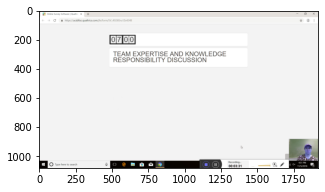

detect discussion:  211.58992513020831
10000


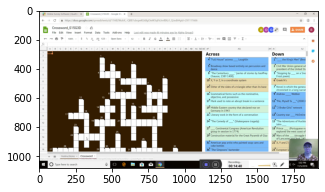

detect crossword:  880.1219889322916
20000
30000


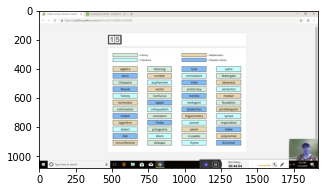

detect memory:  2644.8819986979165
134
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/GAMMA/S15G3D_Webcam_Gamma.mp4
total 41948.0
start


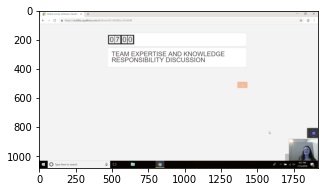

detect discussion:  152.23006184895831
10000


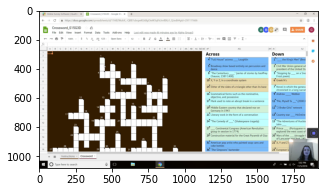

detect crossword:  799.4619954427083
20000
30000


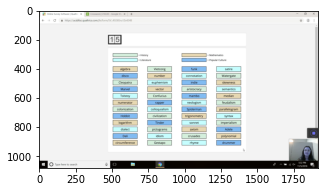

detect memory:  2578.7880045572915
135
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_05_2018/WEBCAM/GROUP 3/OMEGA/S15G3D_Webcam_Omega.mp4
total 43322.0
start


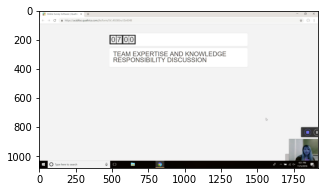

detect discussion:  179.37003580729166
10000


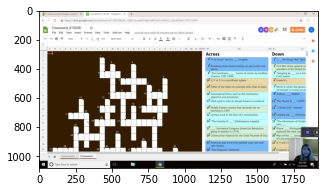

detect crossword:  838.5900065104166
20000
30000


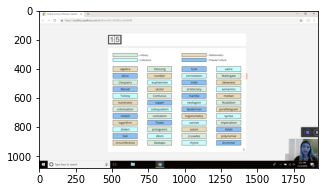

detect memory:  2613.6319986979165
136
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 1/ALPHA/S16G1C_Webcam_Alpha.mp4
total 42612.0
start


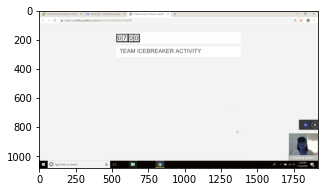

detect discussion:  203.4140625
10000


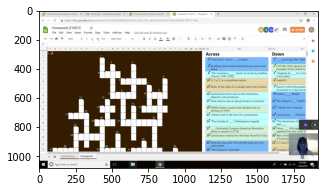

detect crossword:  905.0279947916666
20000
30000


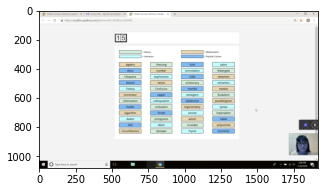

detect memory:  2594.857991536458
137
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 1/BETA/S16G1C_Webcam_Beta.mp4
total 42810.0
start


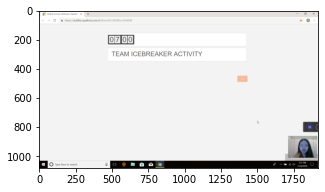

detect discussion:  237.88997395833331
10000


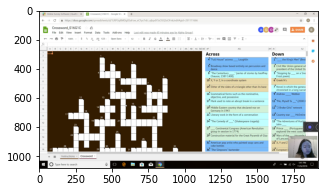

detect crossword:  825.553955078125
20000
30000


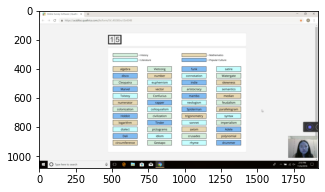

detect memory:  2522.691975911458
138
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 1/GAMMA/S16G1C_Webcam_Gamma.mp4
total 41270.0
start


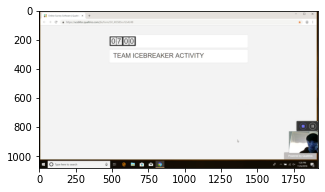

detect discussion:  163.679931640625
10000


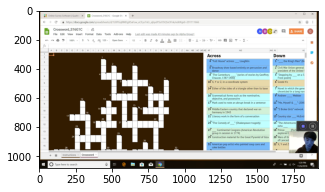

detect crossword:  864.3719889322916
20000
30000


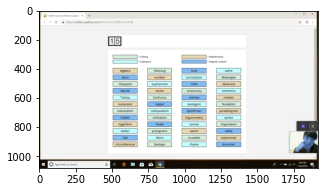

detect memory:  2645.885986328125
139
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 1/OMEGA/S16G1C_Webcam_Omega.mp4
total 42472.0
start


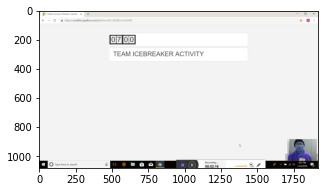

detect discussion:  137.300048828125
10000


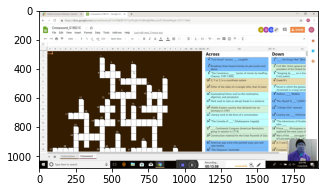

detect crossword:  839.0360514322916
20000
30000


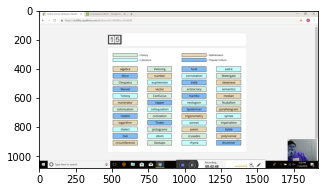

detect memory:  2569.0900065104165
140
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 3/ALPHA/S16G3C_Webcam_Alpha.mp4
total 43350.0
start


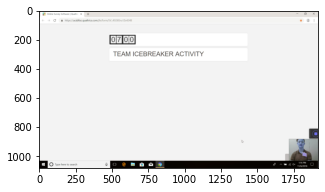

detect discussion:  117.93001302083333
10000


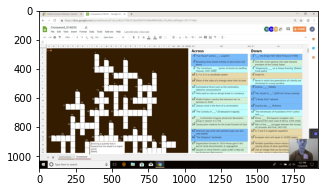

detect crossword:  798.196044921875
20000
30000


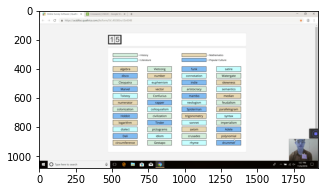

detect memory:  2596.93603515625
141
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 3/BETA/S16G3C_Webcam_Beta.mp4
total 44085.0
start


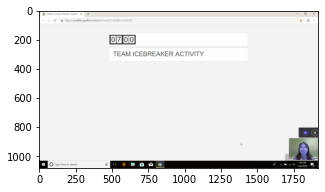

detect discussion:  201.35205078125
10000


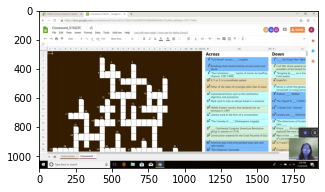

detect crossword:  873.010009765625
20000
30000


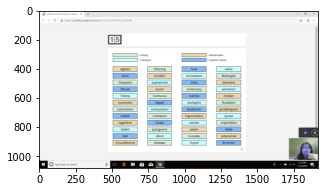

detect memory:  2678.7560221354165
142
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 3/GAMMA/S16G3C_Webcam_Gamma.mp4
total 43666.0
start


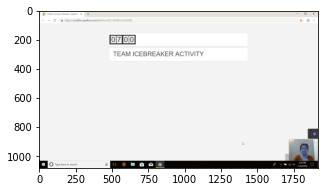

detect discussion:  144.98006184895831
10000


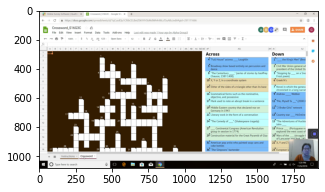

detect crossword:  813.822021484375
20000
30000


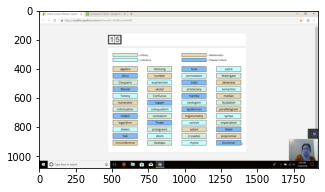

detect memory:  2622.220052083333
143
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 3/OMEGA/S16G3C_Webcam_Omega.mp4
total 42670.0
start


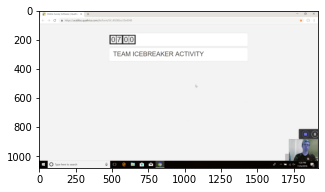

detect discussion:  173.47200520833331
10000


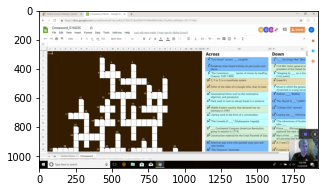

detect crossword:  860.6959635416666
20000
30000


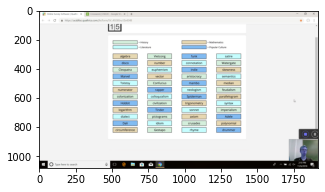

detect memory:  2649.431966145833
144
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 1/ALPHA/S18G1C_Webcam_Alpha.mp4
total 42442.0
start


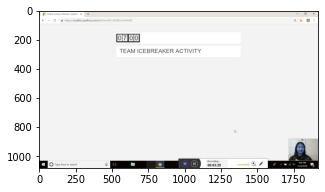

detect discussion:  205.35001627604166
10000


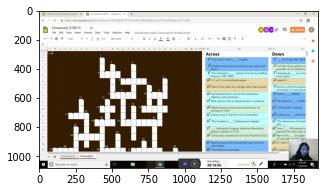

detect crossword:  894.6820475260416
20000
30000


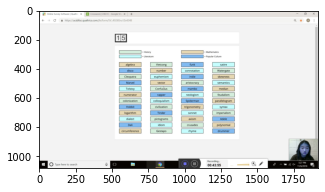

detect memory:  2635.211995442708
145
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 1/BETA/S18G1C_Webcam_Beta.mp4
total 42063.0
start


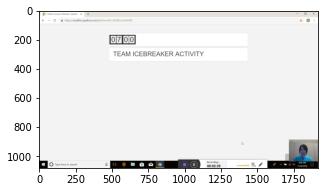

detect discussion:  155.06998697916666
10000


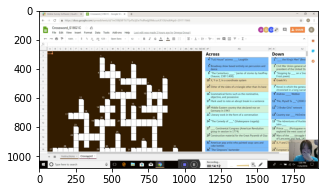

detect crossword:  852.2220052083333
20000
30000


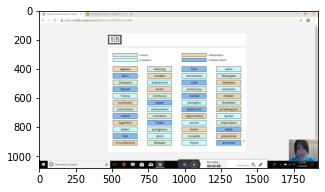

detect memory:  2588.510009765625
146
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 1/GAMMA/S18G1C_Webcam_Gamma.mp4
total 40617.0
start


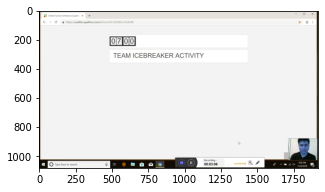

detect discussion:  186.71199544270831
10000


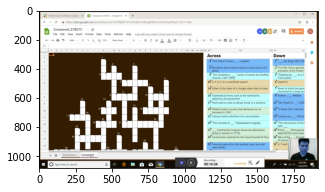

detect crossword:  874.4879557291666
20000
30000


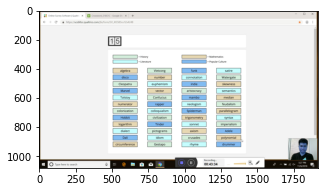

detect memory:  2614.3500162760415
147
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_06_2018/WEBCAM/GROUP 1/OMEGA/S18G1C_Webcam_Omega.mp4
total 43124.0
start


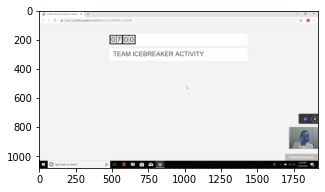

detect discussion:  100.47200520833333
10000


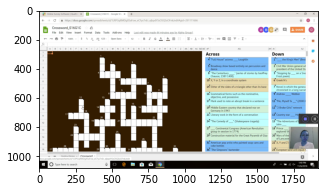

detect crossword:  803.4639485677083
20000
30000


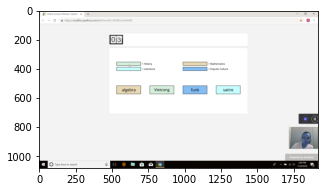

detect memory:  2515.6119791666665
148
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_07_2018/WEBCAM/GROUP1/S19G1B_Webcam_Alpha.mp4
total 42540.0
start


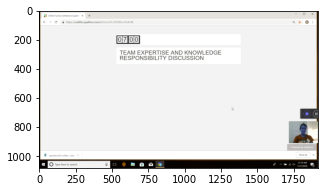

detect discussion:  189.80997721354166
10000


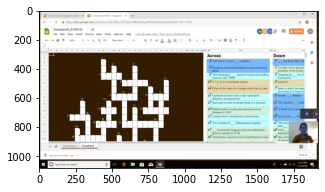

detect crossword:  732.364013671875
20000
30000


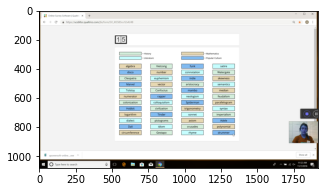

detect memory:  2426.5380045572915
149
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_07_2018/WEBCAM/GROUP1/S19G1B_Webcam_Beta.mp4
total 40590.0
start


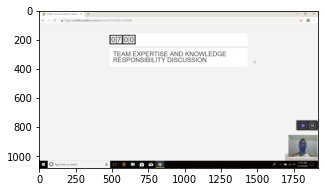

detect discussion:  160.78995768229166
10000


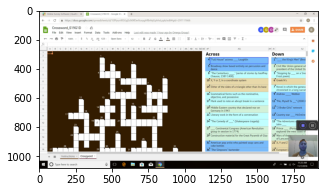

detect crossword:  710.0900065104166
20000
30000


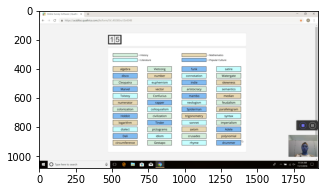

detect memory:  2397.7980143229165
150
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_07_2018/WEBCAM/GROUP1/S19G1B_Webcame_Gamma.mp4
total 40576.0
start


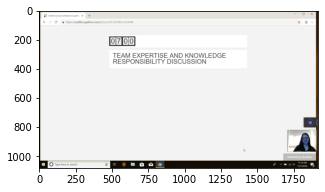

detect discussion:  227.95198567708331
10000


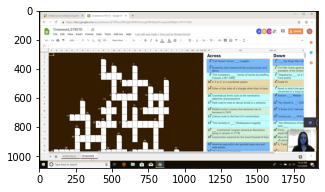

detect crossword:  761.7019856770833
20000
30000


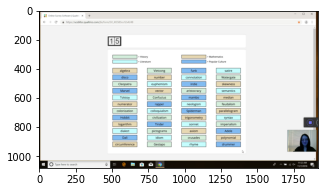

detect memory:  2464.203938802083
151
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_07_2018/WEBCAM/GROUP1/S19G1B_Webcam_Omega.mp4
total 40329.0
start


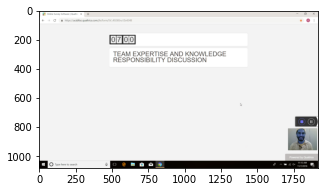

detect discussion:  135.25797526041666


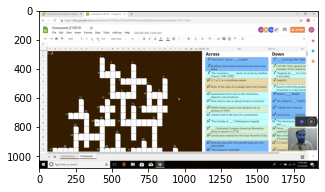

detect crossword:  661.385986328125
10000
20000
30000


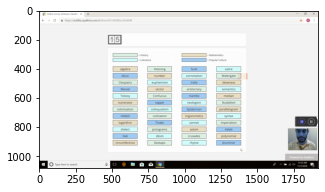

detect memory:  2367.4159342447915
152
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP1/ALPHA/S20G1A_Webcam_Alpha.mp4
total 36660.0
start


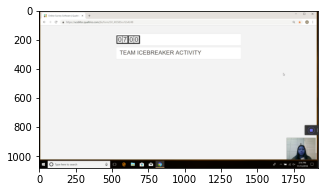

detect discussion:  141.65999348958331


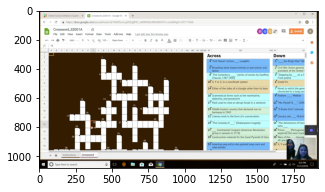

detect crossword:  677.6299641927083
10000
20000
30000


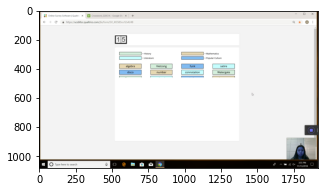

detect memory:  2439.7999674479165
153
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP1/BETA/S20G1A_Webcam_Beta.mp4
total 39841.0
start


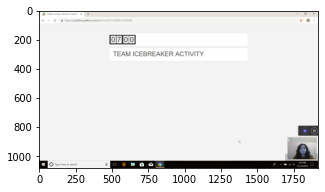

detect discussion:  103.95003255208333


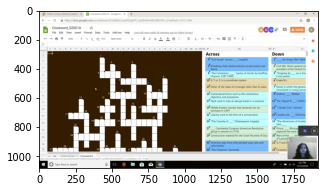

detect crossword:  622.0440266927083
10000
20000
30000


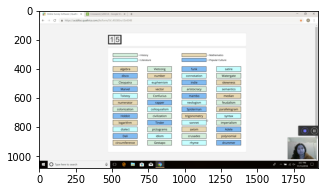

detect memory:  2388.126057942708
154
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP1/GAMMA/S20G1A_Webcam_Gamma.mp4
total 37649.0
start


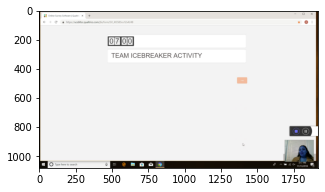

detect discussion:  160.98396809895831
10000


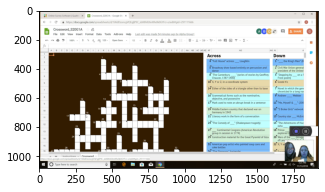

detect crossword:  686.333984375
20000
30000


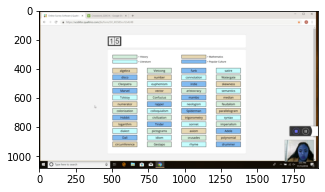

detect memory:  2443.4860026041665
155
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP1/OMEGA/S20G1A_Webcam_Omega.mp4
total 37319.0
start


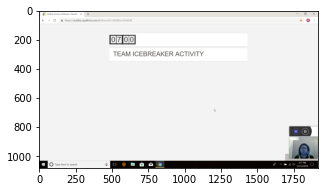

detect discussion:  87.011962890625


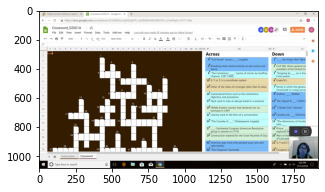

detect crossword:  612.5919596354166
10000
20000
30000


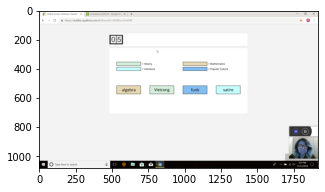

detect memory:  2283.191975911458
156
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP2/ALPHA/S20G2A_Webcam_Alpha.mp4
total 42086.0
start


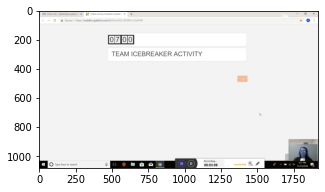

detect discussion:  189.88004557291666
10000


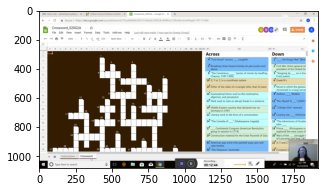

detect crossword:  764.93603515625
20000
30000


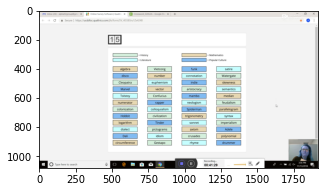

detect memory:  2489.513997395833
157
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP2/BETA/S20G2A_WEBCAM_BETA.mp4
total 36109.0
start


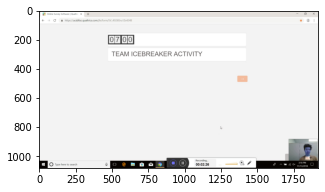

detect discussion:  147.11197916666666


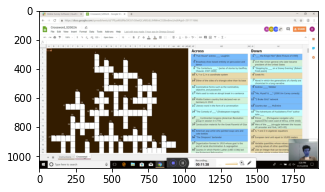

detect crossword:  699.001953125
10000
finish
158
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP2/GAMMA/S20G2A_Webcam_Gamma.mp4
total 41579.0
start


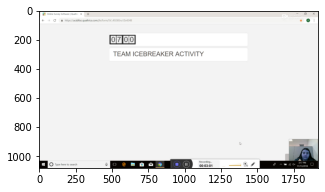

detect discussion:  181.99007161458331
10000


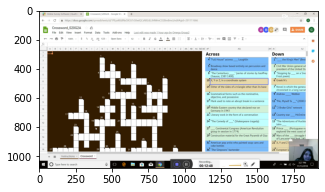

detect crossword:  768.342041015625
20000
30000


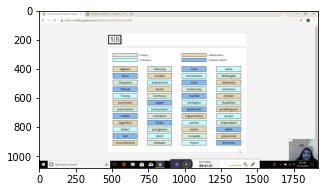

detect memory:  2481.072021484375
159
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP2/OMEGA/S20G2A_WBECAM_OMEGA.mp4
total 37699.0
start
finish
160
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP3/ALPHA/S20G3A_Webcam_Alpha.mp4
total 38762.0
start


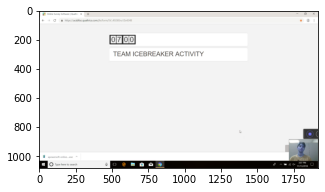

detect discussion:  267.7820638020833
10000


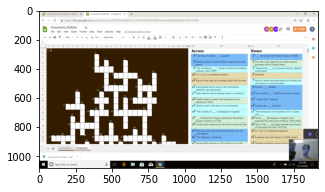

detect crossword:  826.6720377604166
20000
30000


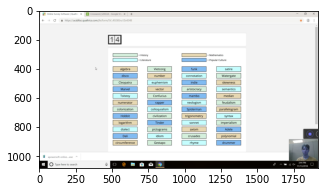

detect memory:  2515.6000162760415
161
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP3/BETA/S20G3A_Webcam_Beta.mp4
total 40994.0
start


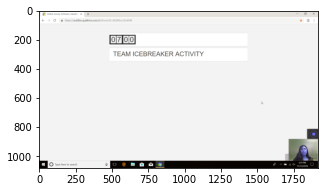

detect discussion:  229.60001627604166
10000


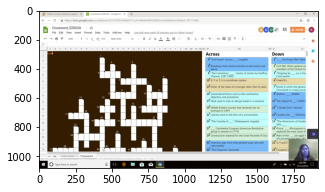

detect crossword:  752.656005859375
20000
30000


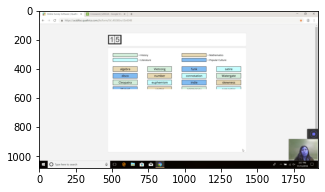

detect memory:  2489.116048177083
162
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP3/GAMMA/S20G3A_Webcam_Gamma.mp4
total 37128.0
start


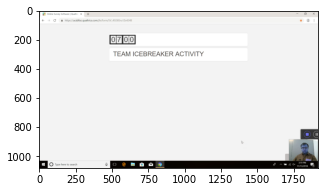

detect discussion:  114.56998697916666


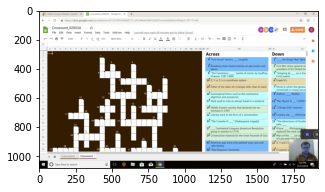

detect crossword:  646.469970703125
10000
20000
30000


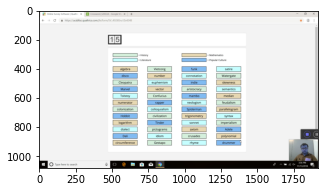

detect memory:  2367.3619791666665
163
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP3/OMEGA/S20G3A_Webcam_Omega.mp4
total 38780.0
start


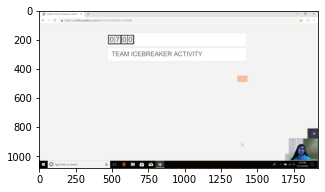

detect discussion:  144.43001302083331


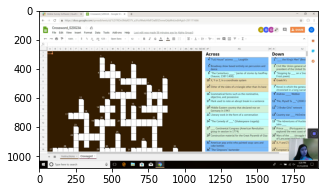

detect crossword:  660.5840657552083
10000
20000
30000


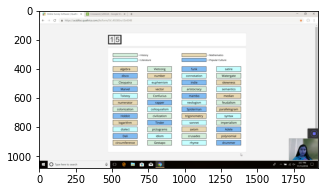

detect memory:  2403.6820475260415
164
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP1/ALPHA/S21G1B_Webcam_Alpha.mp4
total 44308.0
start


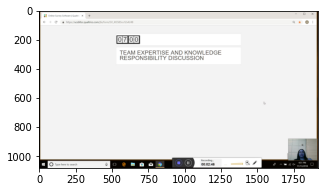

detect discussion:  166.85001627604166
10000


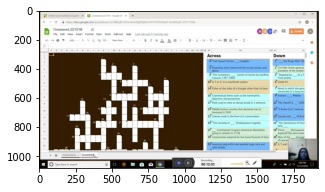

detect crossword:  723.4860026041666
20000
30000
40000


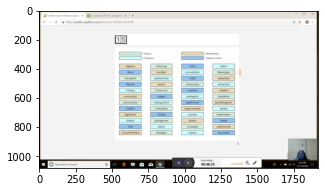

detect memory:  2783.878011067708
165
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP1/BETA/S21G1B_Webcam_Beta.mp4
total 39111.0
start


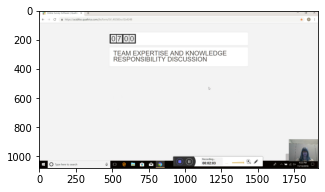

detect discussion:  123.17399088541666


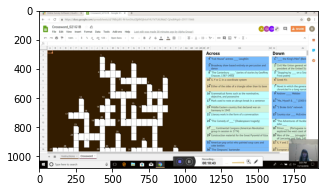

detect crossword:  643.364013671875
10000
20000
30000


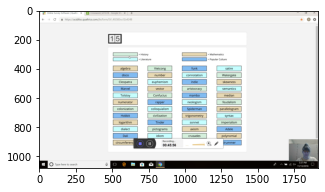

detect memory:  2756.720052083333
166
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP1/GAMMA/S21G1B_Webcam_Gamma.mp4
total 43905.0
start


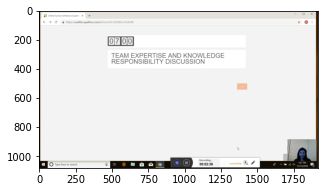

detect discussion:  159.04402669270831
10000


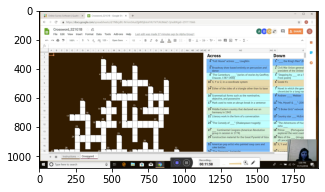

detect crossword:  719.093994140625
20000
30000


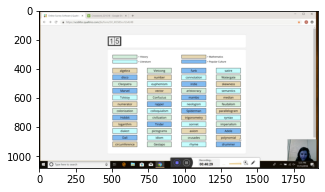

detect memory:  2789.416015625
167
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP1/OMEGA/S21G1B_Webcam_Omega_part1.mp4
total 34040.0
start


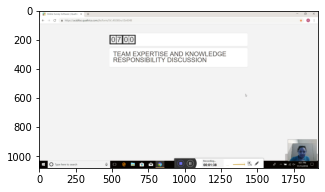

detect discussion:  98.196044921875


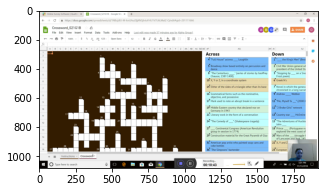

detect crossword:  643.83203125
10000
20000
30000
finish
168
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP3/ALPHA/S21G3B_Webcam_Alpha.mp4
total 38490.0
start


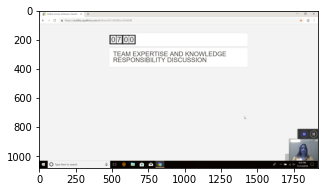

detect discussion:  130.24007161458331


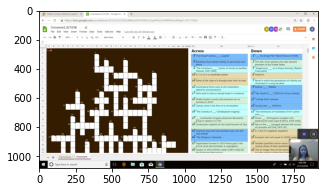

detect crossword:  665.9120279947916
10000
20000
30000


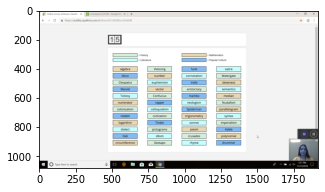

detect memory:  2372.158040364583
169
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP3/BETA/S21G3B_Webcam_Beta.mp4
total 40118.0
start


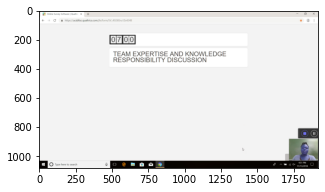

detect discussion:  212.449951171875
10000


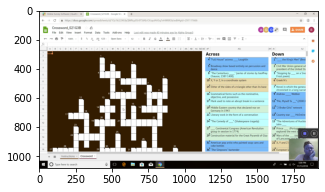

detect crossword:  738.011962890625
20000
30000


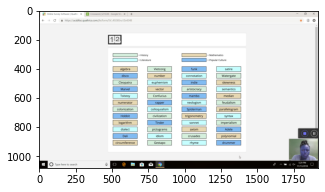

detect memory:  2458.961995442708
170
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP3/GAMMA/S21G3B_Webcam_Gamma.mp4
total 39616.0
start


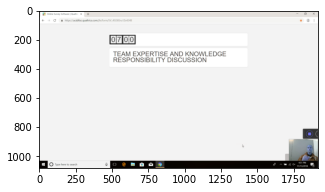

detect discussion:  162.90006510416666
10000


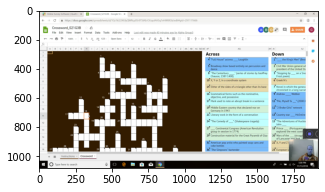

detect crossword:  710.843994140625
20000
30000


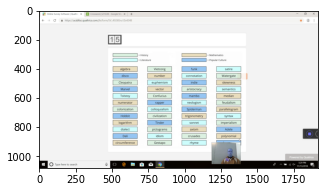

detect memory:  2404.56201171875
171
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_13_2018/WEBCAM/GROUP3/OMEGA/S21G3B_Webcam_Omega.mp4
total 38528.0
start


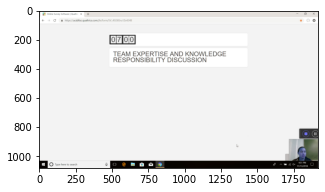

detect discussion:  188.23006184895831
10000


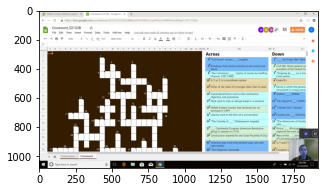

detect crossword:  710.926025390625
20000
30000


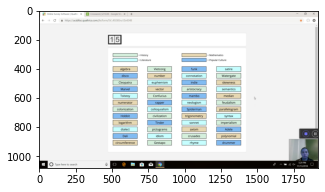

detect memory:  2430.468017578125
172
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP1/ALPHA/S22G1A_Webcam_Alpha.mp4
total 37465.0
start


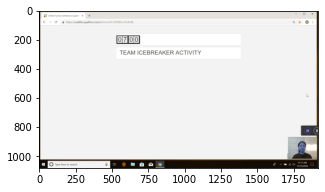

detect discussion:  134.9599609375


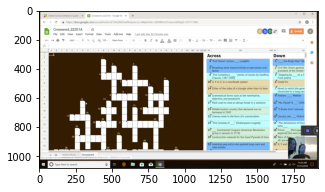

detect crossword:  652.9259440104166
10000
20000
30000


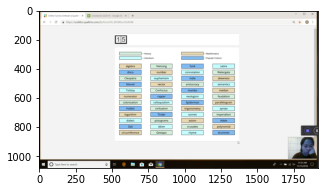

detect memory:  2395.327962239583
173
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP1/BETA/S22G1A_Webcam_Beta.mp4
total 37179.0
start


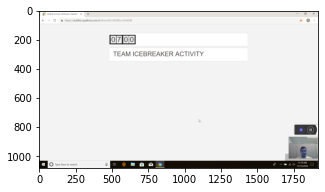

detect discussion:  111.56998697916666


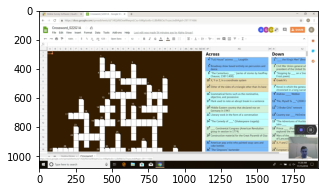

detect crossword:  622.39794921875
10000
20000
30000


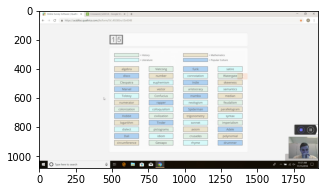

detect memory:  2370.753987630208
174
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP1/GAMMA/S22G1A_Webcam_Gamma.mp4
total 37524.0
start


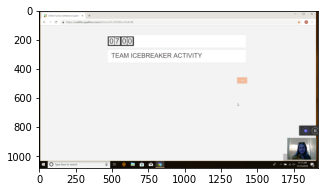

detect discussion:  155.780029296875
10000


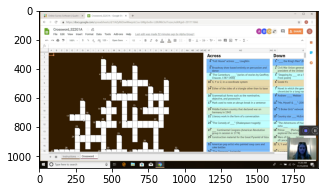

detect crossword:  676.1720377604166
20000
30000


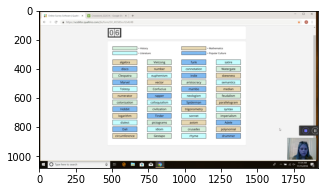

detect memory:  2334.804036458333
175
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP1/OMEGA/S22G1A_Webcam_Omega.mp4
total 37311.0
start


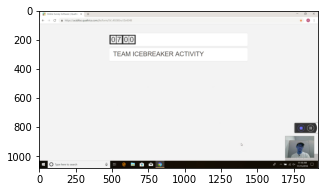

detect discussion:  91.9599609375


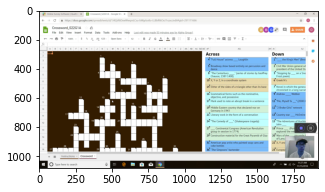

detect crossword:  608.2439778645833
10000
20000
30000


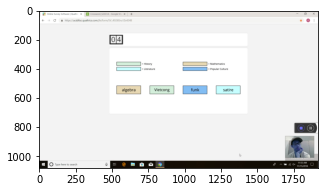

detect memory:  2280.0399576822915
176
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP3/ALPHA/S22G3A_Webcam_Alpha.mp4
total 38251.0
start


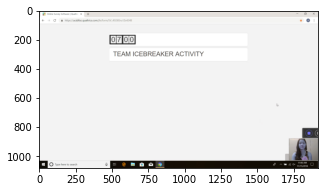

detect discussion:  98.82405598958333


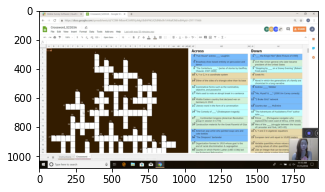

detect crossword:  639.0
10000
20000
30000


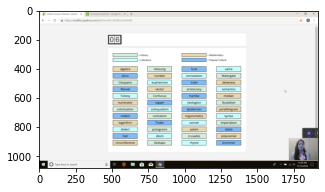

detect memory:  2339.81005859375
177
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP3/BETA/S22G3A_Webcam_Beta.mp4
total 34934.0
start


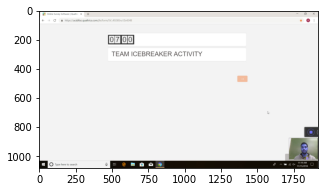

detect discussion:  181.070068359375


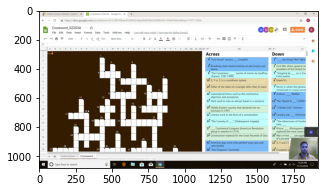

detect crossword:  705.4500325520833
10000
20000
30000


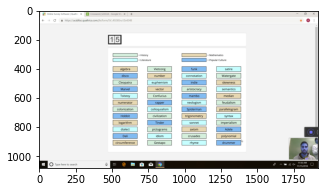

detect memory:  2407.3400065104165
178
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP3/GAMMA/S22G3A_Webcam_Gamma.mp4
total 35444.0
start


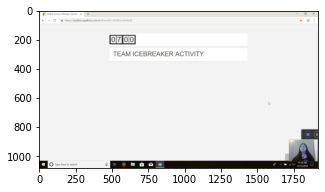

detect discussion:  123.50992838541666


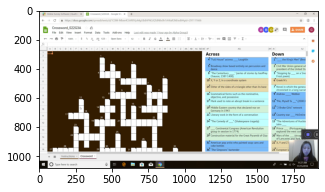

detect crossword:  651.2799479166666
10000
20000
30000


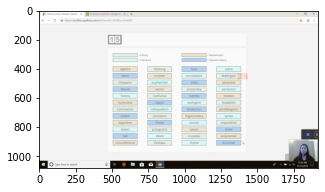

detect memory:  2350.719970703125
179
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP3/OMEGA/S22G3A_Webcam_Omega.mp4
total 35711.0
start


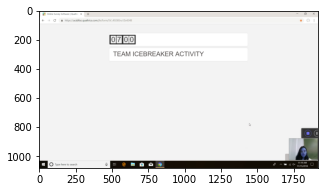

detect discussion:  151.04996744791666


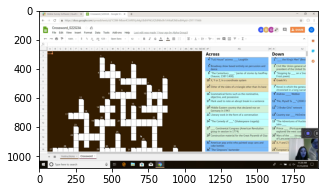

detect crossword:  687.4599609375
10000
20000
30000


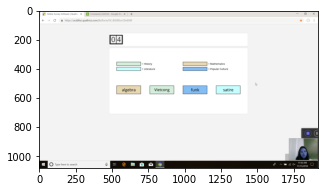

detect memory:  2397.5599772135415
180
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP1/ALPHA/S23G1B_Webcam_Alpha.mp4
total 39613.0
start


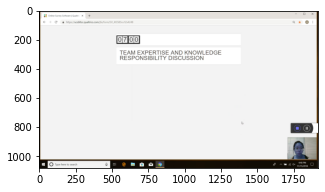

detect discussion:  178.00992838541666
10000


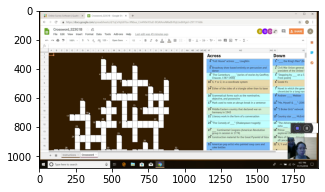

detect crossword:  702.3159993489583
20000
30000


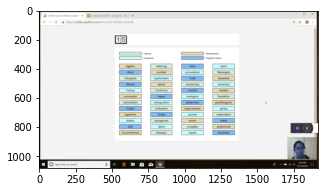

detect memory:  2470.087972005208
181
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP1/BETA/S23G1B_Webcam_Beta.mp4
total 39120.0
start


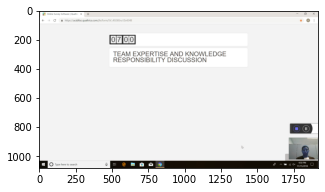

detect discussion:  128.489990234375


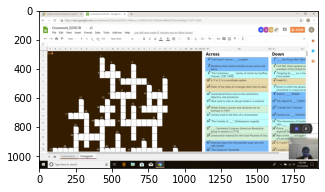

detect crossword:  652.7539876302083
10000
20000
30000


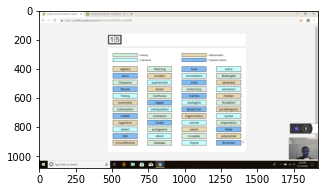

detect memory:  2424.3759765625
182
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP1/GAMMA/S23G1B_Webcam_Gamma.mp4
total 39058.0
start


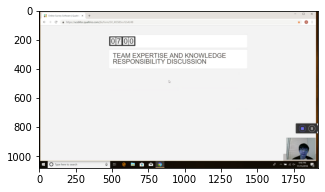

detect discussion:  157.050048828125
10000


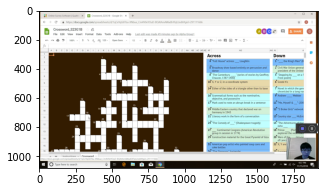

detect crossword:  685.280029296875
20000
30000


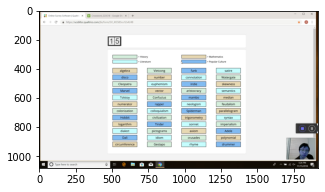

detect memory:  2453.542073567708
183
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP1/OMEGA/S23G1B_Webcam_Omega.mp4
total 39300.0
start


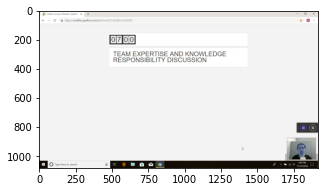

detect discussion:  110.11002604166666


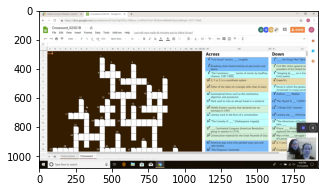

detect crossword:  644.93603515625
10000
20000
30000


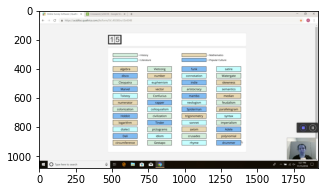

detect memory:  2404.4840494791665
184
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP2/ALPHA/S23G2B_WEBCAM_Alpha.mp4
total 39823.0
start


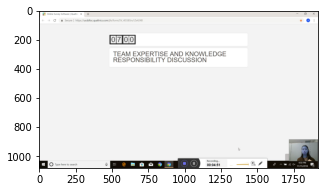

detect discussion:  291.9900716145833
10000


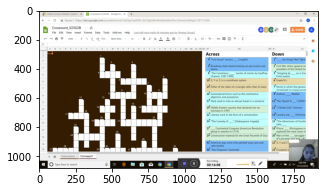

detect crossword:  846.1800130208333
20000
30000


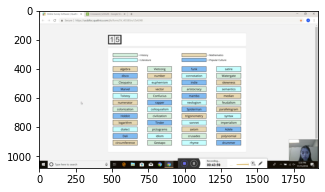

detect memory:  2639.6500651041665
185
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP2/BETA/S23G2B_WEBCAM_Beta.mp4
total 40212.0
start


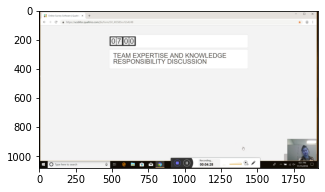

detect discussion:  268.07999674479163
10000


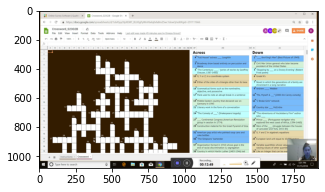

detect crossword:  829.9039713541666
20000
30000


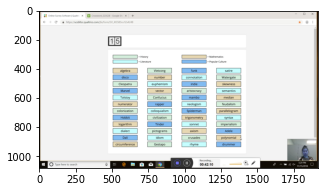

detect memory:  2530.973958333333
186
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP2/GAMMA/S23G2B_Webcam_Gamma.mp4
total 41089.0
start


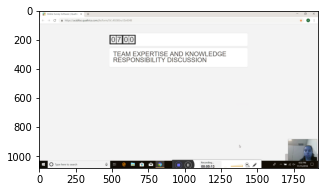

detect discussion:  313.27392578125
10000


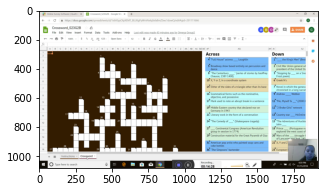

detect crossword:  868.553955078125
20000
30000


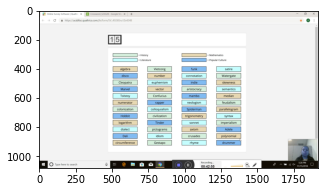

detect memory:  2575.255940755208
187
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP2/OMEGA/S23G2B_WEBCAM_Omega.mp4
total 40083.0
start


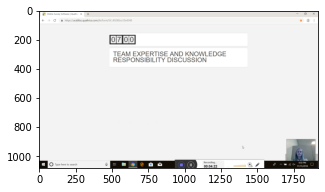

detect discussion:  263.0
10000


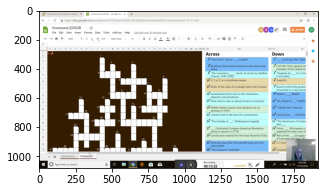

detect crossword:  802.4720052083333
20000
30000


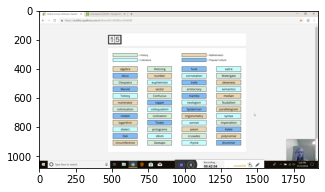

detect memory:  2524.77197265625
188
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP3/ALPHA/S23G3B_Webcam_Alpha.mp4
total 35965.0
start


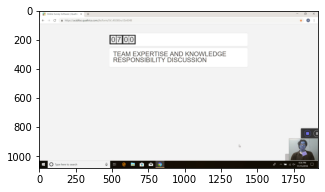

detect discussion:  102.62198893229166


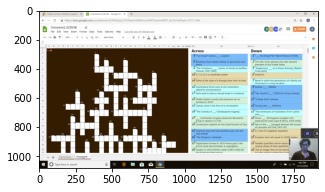

detect crossword:  636.9720052083333
10000
20000
30000


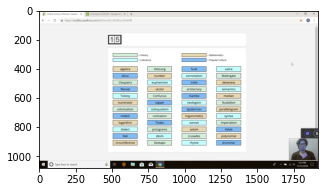

detect memory:  2396.2080078125
189
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP3/BETA/S23G3B_Webcam_Beta.mp4
total 34028.0
start


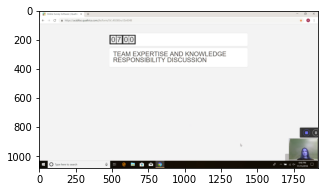

detect discussion:  181.77994791666666
10000


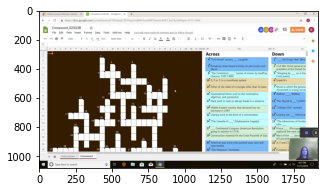

detect crossword:  719.8499348958333
20000
30000


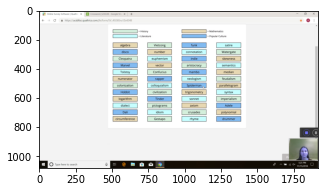

detect memory:  2396.849934895833
190
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP3/GAMMA/S23G3B_Webcam_Gamma.mp4
total 33499.0
start


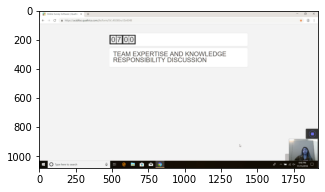

detect discussion:  123.86995442708333


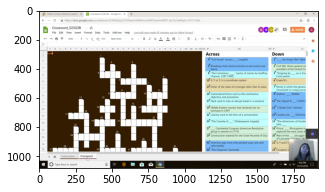

detect crossword:  622.3599446614583
10000
20000
30000


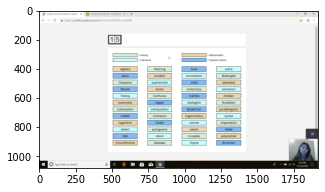

detect memory:  2409.639973958333
191
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_15_2018/WEBCAM/GROUP3/OMEGA/S23G3B_Webcam_Omega.mp4
total 33907.0
start


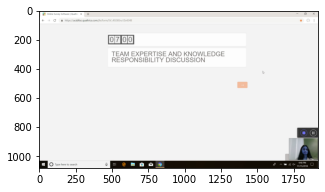

detect discussion:  154.70003255208331


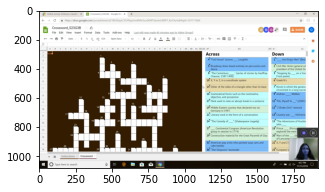

detect crossword:  677.239990234375
10000
20000
30000


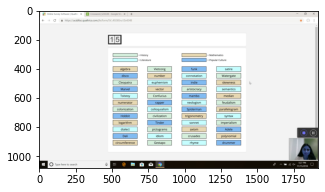

detect memory:  2444.3800455729165
192
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 1/Alpha/S24G1C_Webcam_Alpha.mp4
total 38303.0
start


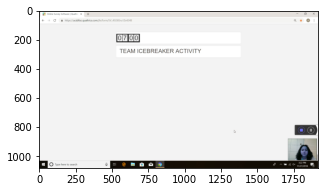

detect discussion:  152.030029296875
10000


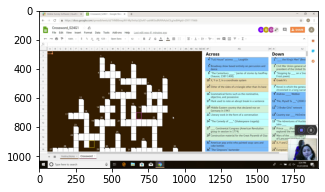

detect crossword:  837.030029296875
20000
30000


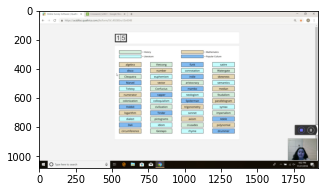

detect memory:  2556.460042317708
193
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 1/Beta/S24G1C_Webcam_Beta.mp4
total 38480.0
start


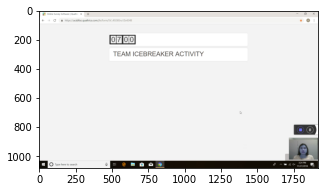

detect discussion:  126.80997721354166
10000


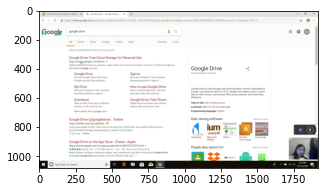

detect crossword:  730.969970703125
20000
30000


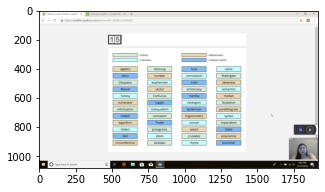

detect memory:  2565.219970703125
194
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 1/Gamma/S24G1C_Webcam_Gamma.mp4
total 38653.0
start


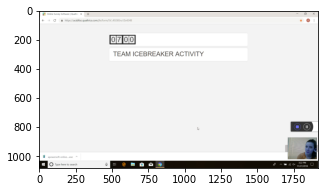

detect discussion:  182.26993815104166
10000


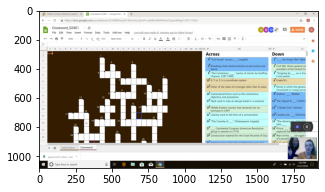

detect crossword:  864.7099609375
20000
30000


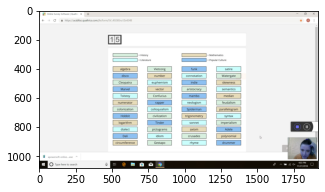

detect memory:  2615.920003255208
195
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 1/Omega/S24G1C_Webcam_Omega.mp4
total 38982.0
start


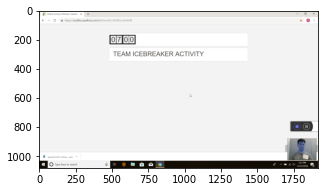

detect discussion:  104.68001302083333
10000


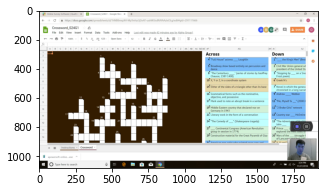

detect crossword:  781.7899576822916
20000
30000


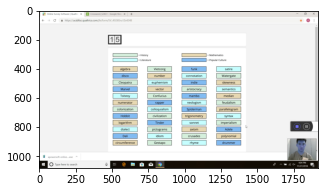

detect memory:  2549.0499674479165
196
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 3/Alpha/S24G3C_Webcam_Alpha.mp4
total 39565.0
start


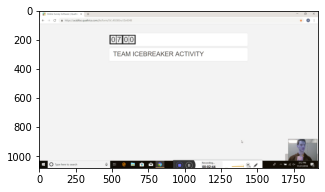

detect discussion:  164.89998372395831
10000


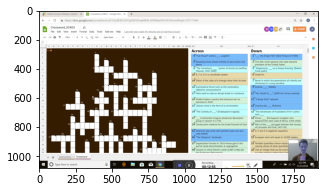

detect crossword:  776.3699544270833
20000
30000


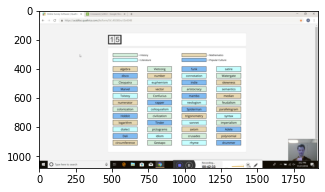

detect memory:  2553.409993489583
197
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 3/Beta/S24G3C_Webcam_Beta.mp4
total 39313.0
start


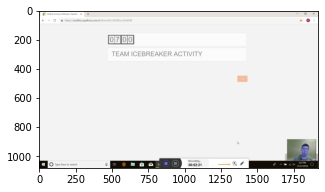

detect discussion:  142.05997721354166
10000


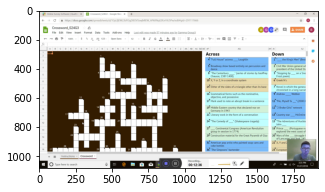

detect crossword:  757.02001953125
20000
30000


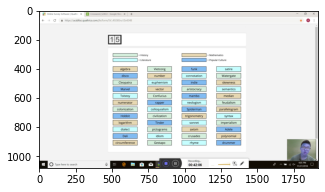

detect memory:  2527.3099772135415
198
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 3/Gamma/S24G3C_Webcam_Gamma.mp4
total 38360.0
start


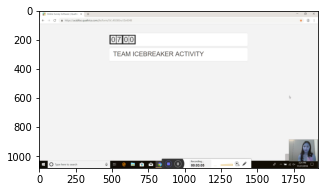

detect discussion:  185.949951171875
10000


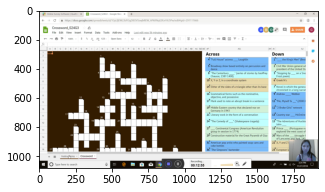

detect crossword:  775.9599609375
20000
30000


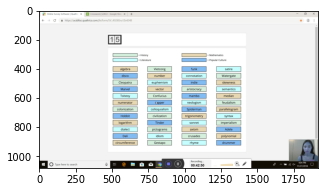

detect memory:  2570.7799479166665
199
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 3/Omega/S24G3C_Webcam_Omega.mp4
total 37077.0
start


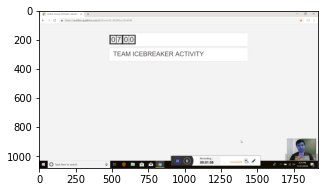

detect discussion:  119.02994791666666


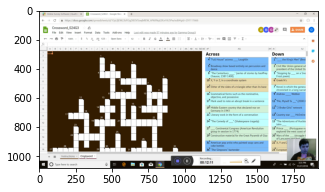

detect crossword:  731.969970703125
10000
20000
30000


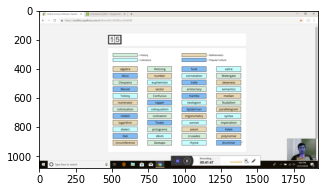

detect memory:  2507.7999674479165
200
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 1/Alpha/S25G1D_Webcam_Alpha.mp4
total 38419.0
start


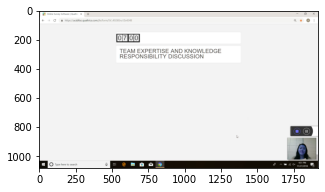

detect discussion:  131.22998046875
10000


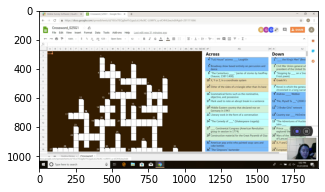

detect crossword:  780.469970703125
20000
30000


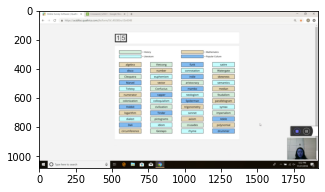

detect memory:  2592.149983723958
201
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 1/Beta/S25G1D_Webcam_Beta.mp4
total 39904.0
start


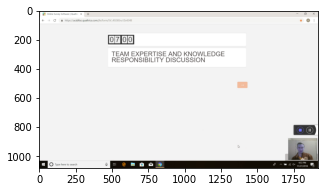

detect discussion:  109.75
10000


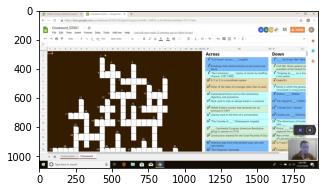

detect crossword:  750.7899576822916
20000
30000


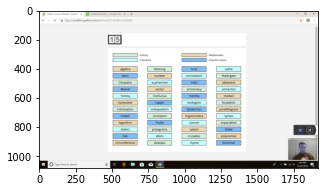

detect memory:  2572.0499674479165
202
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 1/Gamma/S25G1D_Webcam_Gamma.mp4
total 39607.0
start


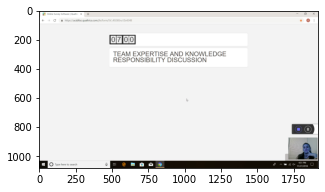

detect discussion:  147.85001627604166
10000


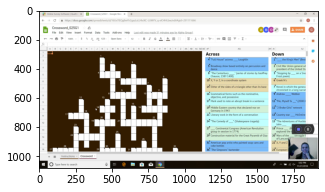

detect crossword:  805.7799479166666
20000
30000


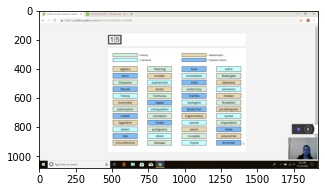

detect memory:  2607.379964192708
203
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 1/Omega/S25G1D_Webcam_Omega.mp4
total 40107.0
start


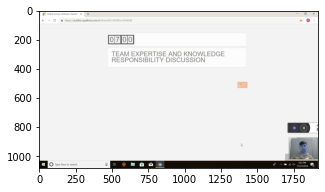

detect discussion:  92.550048828125
10000


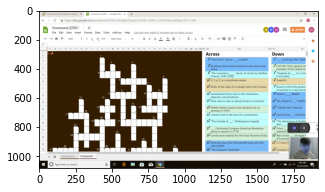

detect crossword:  745.9700520833333
20000
30000


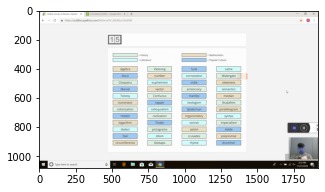

detect memory:  2556.460042317708
204
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 2/Alpha/S25G2D_WEBCAM_ALPHA.mp4
total 37390.0
start


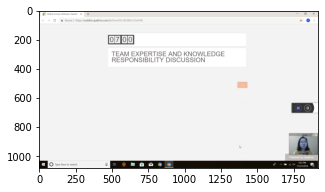

detect discussion:  109.199951171875
10000


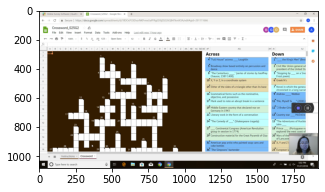

detect crossword:  736.8099772135416
20000
30000


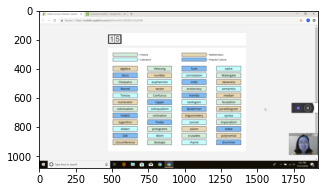

detect memory:  2468.3199869791665
205
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 2/Beta/S25G2D_WEBCAM_Beta.mp4
total 37271.0
start


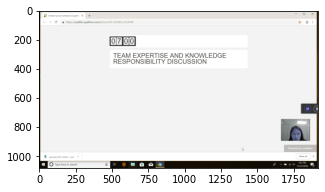

detect discussion:  136.82999674479166
10000


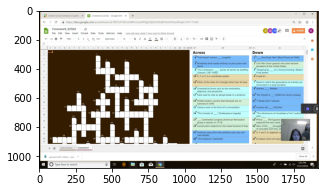

detect crossword:  801.3199869791666
20000
30000


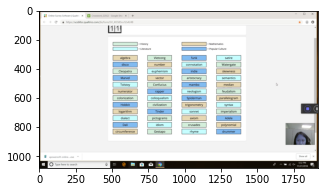

detect memory:  2508.5699869791665
206
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 2/Gamma/S25G2D_Webcam_Gamma.mp4
total 34252.0
start


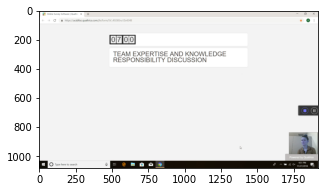

detect discussion:  81.17000325520833


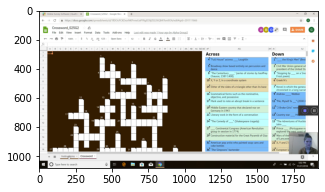

detect crossword:  706.2099609375
10000
20000
30000


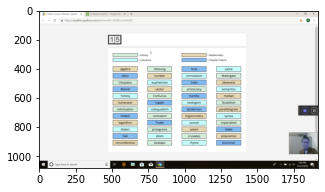

detect memory:  2427.949951171875
207
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 2/Omega/S25G2D_WEBCAM_OMEGA.mp4
total 37502.0
start


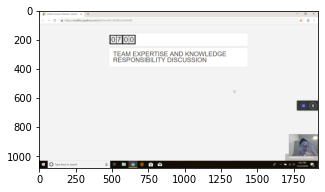

detect discussion:  137.65999348958331
10000


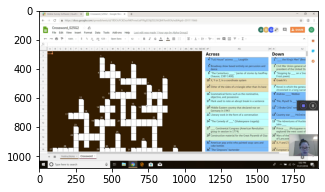

detect crossword:  781.1700032552083
20000
30000


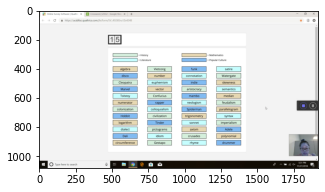

detect memory:  2485.859944661458
208
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 3/Alpha/S25G3D_Webcam_Alpha.mp4
total 37220.0
start


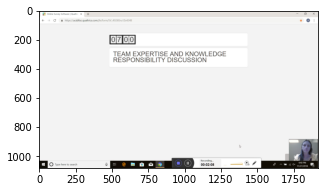

detect discussion:  129.14005533854166
10000


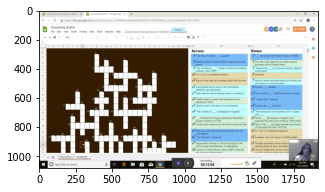

detect crossword:  726.0699869791666
20000
30000


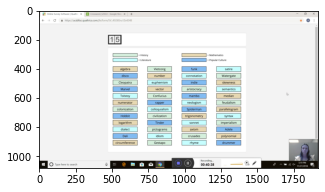

detect memory:  2438.450032552083
209
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 3/Beta/S25G3D_Webcam_Beta.mp4
total 37930.0
start


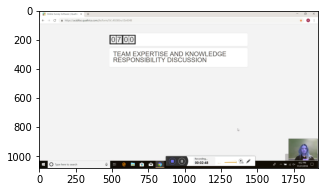

detect discussion:  168.60994466145831
10000


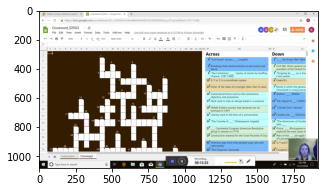

detect crossword:  803.5
20000
30000


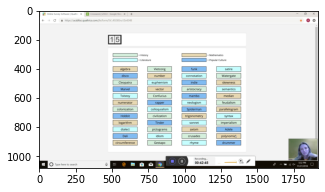

detect memory:  2565.969970703125
210
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 3/Gamma/S25G3D_Webcam_Gamma.mp4
total 35405.0
start


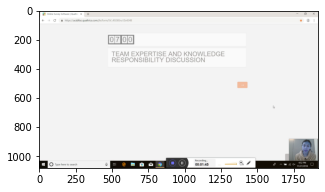

detect discussion:  106.05997721354166
10000


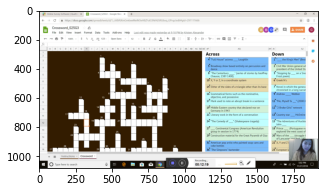

detect crossword:  739.2099609375
20000
30000


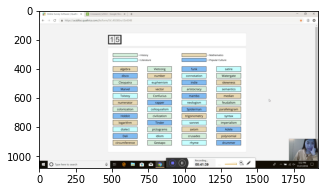

detect memory:  2499.4599609375
211
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_27_2018/Webcam/Group 3/Omega/S25G3D_Webcam_Omega.mp4
total 37388.0
start


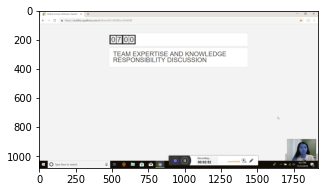

detect discussion:  172.77001953125
10000


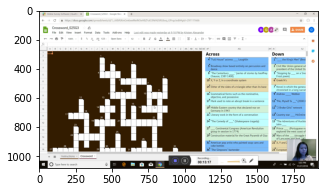

detect crossword:  798.25
20000
30000


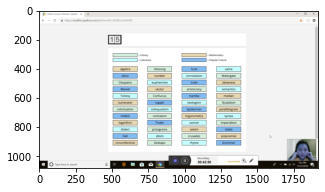

detect memory:  2570.960042317708
212
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 1/Alpha/S26G1A_Webcam_Alpha.mp4
total 36003.0
start


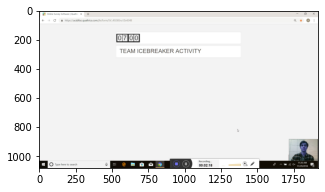

detect discussion:  138.489990234375


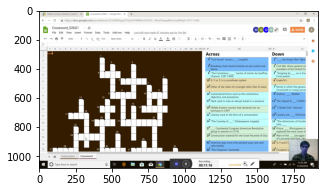

detect crossword:  675.949951171875
10000
20000
30000


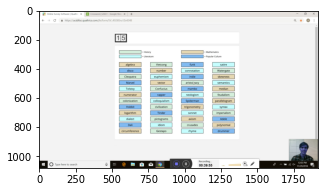

detect memory:  2396.0799967447915
213
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 1/Beta/S26G1A_Webcam_Beta.mp4
total 36990.0
start


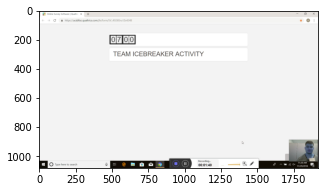

detect discussion:  100.87996419270833


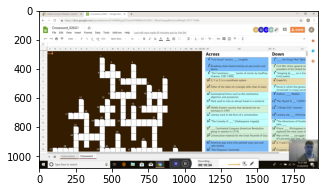

detect crossword:  634.1599934895833
10000
20000
30000


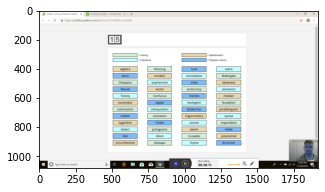

detect memory:  2351.75
214
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 1/Gamma/S26G1A_Webcam_Gamma.mp4
total 34005.0
start


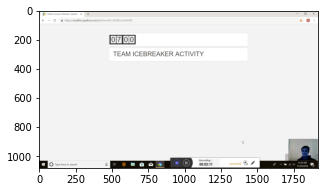

detect discussion:  132.219970703125


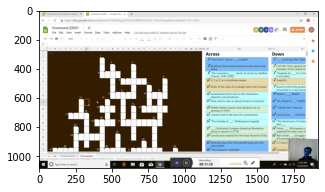

detect crossword:  671.0099283854166
10000
20000
30000


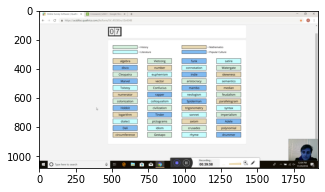

detect memory:  2398.879964192708
215
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 1/Omega/S26G1A_Webcam_Omega.mp4
total 35907.0
start


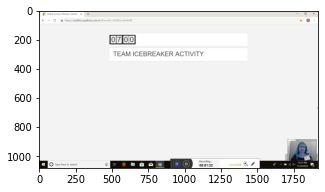

detect discussion:  92.93994140625


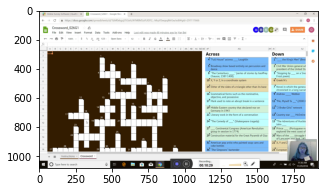

detect crossword:  629.93994140625
10000
20000
30000


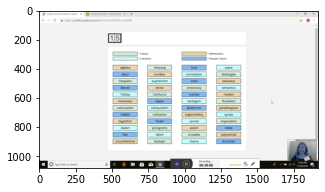

detect memory:  2349.0299479166665
216
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 3/Alpha/S26G3A_Webcam_Alpha.mp4
total 34083.0
start


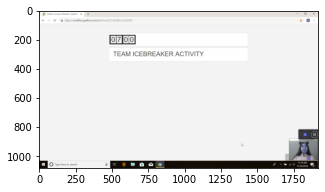

detect discussion:  114.56998697916666


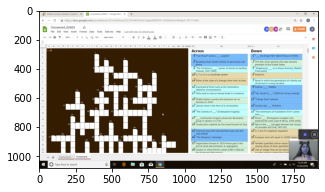

detect crossword:  658.2799479166666
10000
20000
30000


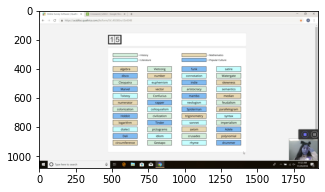

detect memory:  2387.180013020833
217
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 3/Beta/S26G3A_Webcam_Beta.mp4
total 36726.0
start


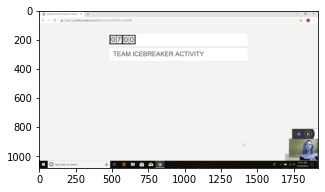

detect discussion:  195.47005208333331
10000


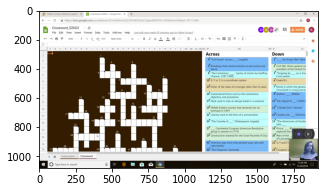

detect crossword:  738.570068359375
20000
30000


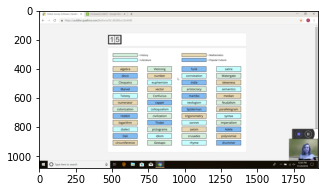

detect memory:  2471.180013020833
218
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 3/Gamma/S26G3A_Webcam_Gamma.mp4
total 35295.0
start


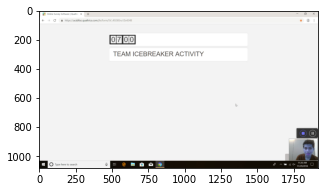

detect discussion:  139.06998697916666


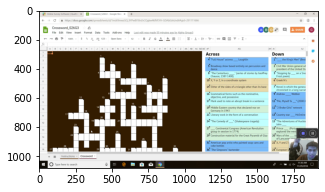

detect crossword:  703.2799479166666
10000
20000
30000


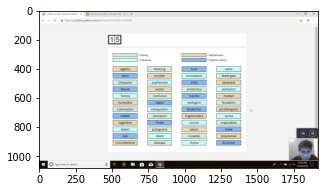

detect memory:  2409.8299967447915
219
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 3/Omega/S26G3A_Webcam_Omega.mp4
total 35791.0
start


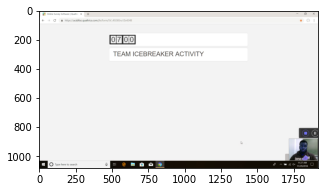

detect discussion:  165.93994140625
10000


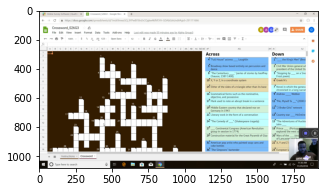

detect crossword:  740.4200032552083
20000
30000


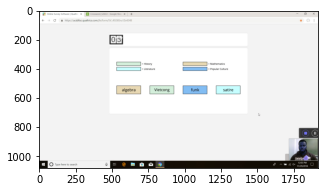

detect memory:  2455.7999674479165
220
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 1/Alpha/S27G1D_Webcam_Alpha.mp4
total 37024.0
start


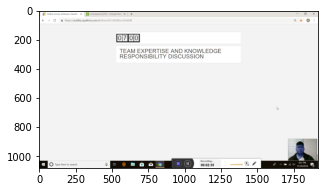

detect discussion:  155.35001627604166
10000


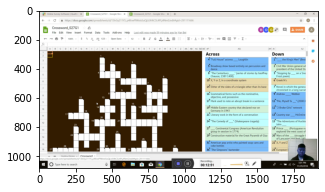

detect crossword:  771.4500325520833
20000
30000


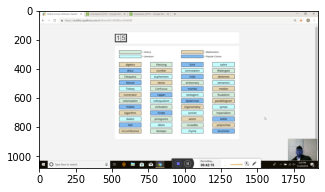

detect memory:  2535.530029296875
221
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 1/Beta/S27G1D_Webcam_Beta.mp4
total 37125.0
start


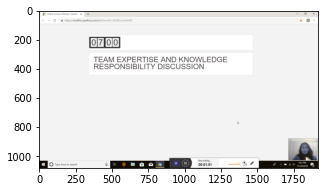

detect discussion:  111.37003580729166


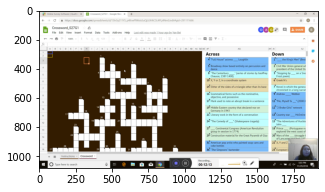

detect crossword:  733.5799967447916
10000
20000
30000


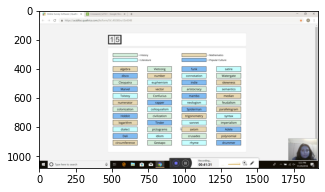

detect memory:  2491.77001953125
222
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 1/Gamma/S27G1D_Webcam_Gamma.mp4
total 36218.0
start


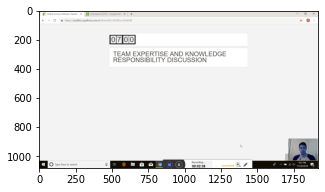

detect discussion:  159.17000325520831
10000


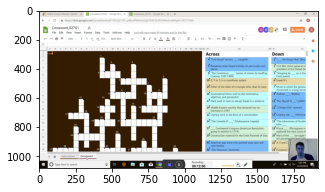

detect crossword:  770.3599446614583
20000
30000


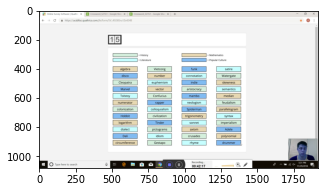

detect memory:  2537.359944661458
223
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 1/Omega/S27G1D_Webcam_Omega.mp4
total 37359.0
start


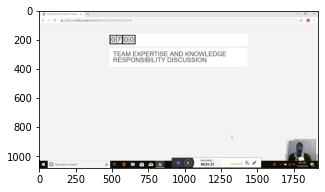

detect discussion:  91.88997395833333


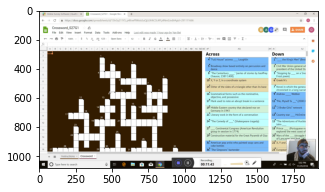

detect crossword:  703.8999837239583
10000
20000
30000


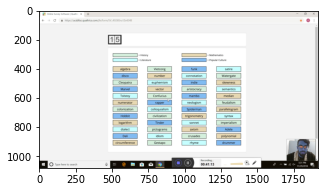

detect memory:  2474.199951171875
224
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 3/Alpha/S27G3D_Webcam_Alpha.mp4
total 36872.0
start


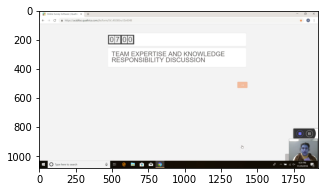

detect discussion:  119.56998697916666
10000


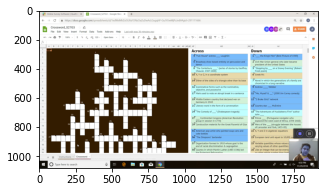

detect crossword:  818.9099934895833
20000
30000


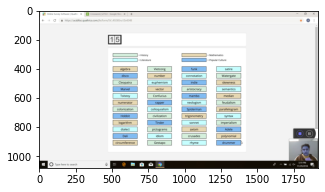

detect memory:  2544.399983723958
225
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 3/Beta/S27G3D_Webcam_Beta.mp4
total 39349.0
start


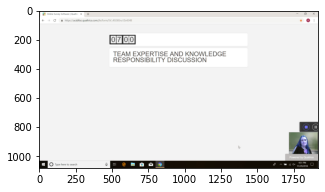

detect discussion:  194.60994466145831
10000


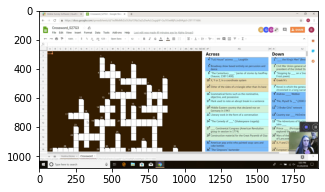

detect crossword:  881.4099934895833
20000
30000


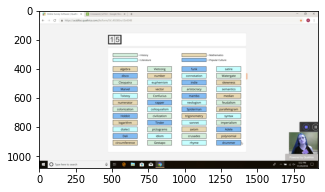

detect memory:  2620.2799479166665
226
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 3/Gamma/S27G3D_Webcam_Gamma.mp4
total 37852.0
start


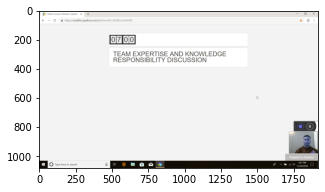

detect discussion:  142.55997721354166
10000


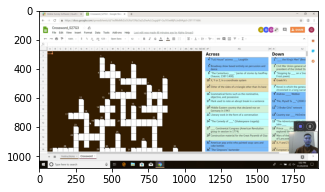

detect crossword:  828.27001953125
20000
30000


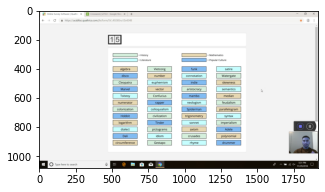

detect memory:  2524.7899576822915
227
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/11_29_2018/Webcam/Group 3/Omega/S27G3D_Webcam_Omega.mp4
total 37529.0
start


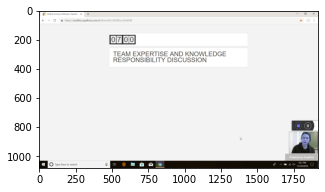

detect discussion:  169.21004231770831
10000


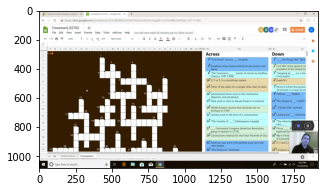

detect crossword:  853.3700358072916
20000
30000


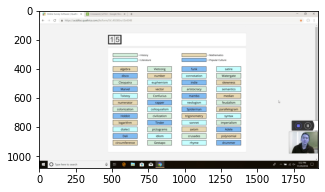

detect memory:  2588.489990234375
228
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_04_2018/Webcam/GROUP1/ALPHA/S29G1B_Webcam_Alpha.mp4
total 34866.0
start


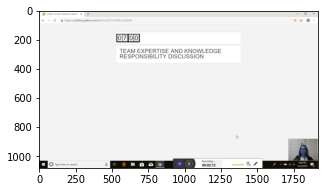

detect discussion:  132.56005859375


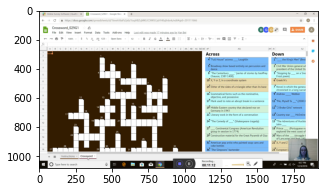

detect crossword:  673.1400553385416
10000
20000
30000


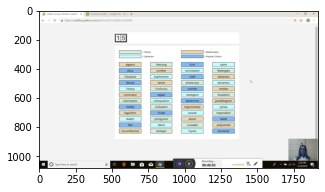

detect memory:  2403.5900065104165
229
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_04_2018/Webcam/GROUP1/BETA/S29G1B_webcam_Beta.mp4
total 36654.0
start


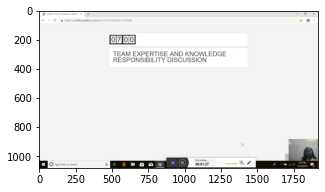

detect discussion:  87.530029296875


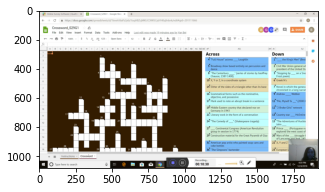

detect crossword:  630.280029296875
10000
20000
30000


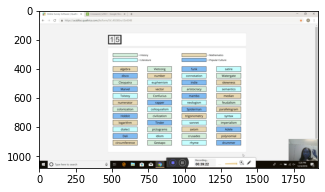

detect memory:  2362.989990234375
230
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_04_2018/Webcam/GROUP1/GAMMA/S29G1B_Webcam_Gamma.mp4
total 34872.0
start


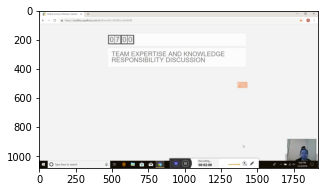

detect discussion:  126.65006510416666


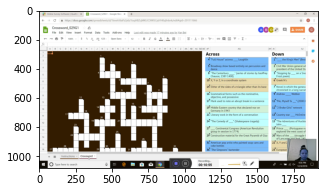

detect crossword:  655.989990234375
10000
20000
30000


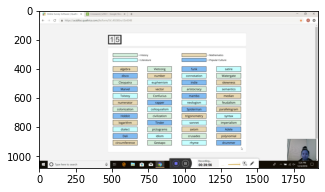

detect memory:  2396.5400390625
231
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_04_2018/Webcam/GROUP1/OMEGA/S29G1B_Webcam_Omega.mp4
total 35479.0
start


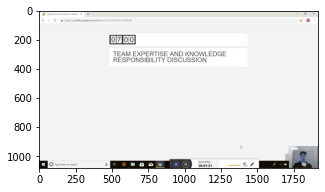

detect discussion:  81.59000651041666


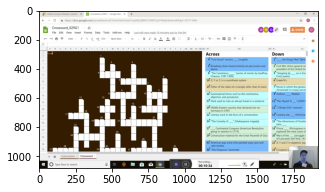

detect crossword:  634.3500162760416
10000
20000
30000


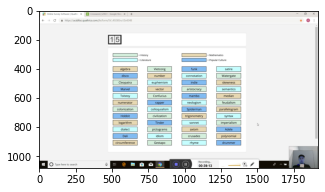

detect memory:  2353.2899576822915
232
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_04_2018/Webcam/GROUP3/ALPHA/S29G3B_Webcam_Alpha.mp4
total 36809.0
start


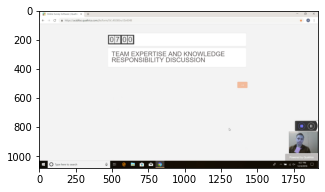

detect discussion:  109.530029296875


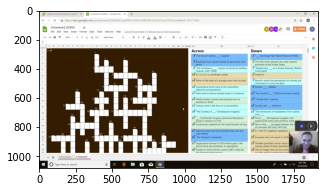

detect crossword:  713.530029296875
10000
20000
30000


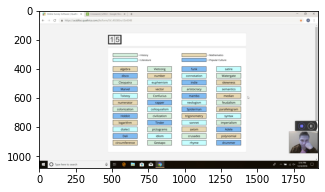

detect memory:  2414.3299967447915
233
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_04_2018/Webcam/GROUP3/BETA/S29G3B_Webcam_Beta.mp4
total 37404.0
start


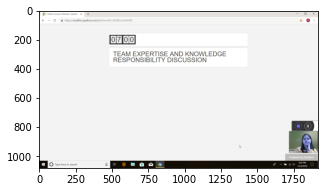

detect discussion:  179.72998046875
10000


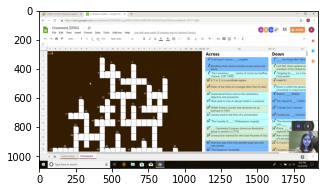

detect crossword:  769.449951171875
20000
30000


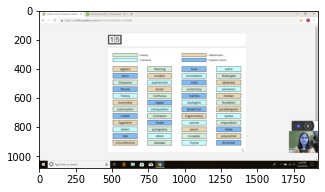

detect memory:  2483.119954427083
234
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_04_2018/Webcam/GROUP3/GAMMA/S29G3B_Webcam_Gamma.mp4
total 34736.0
start


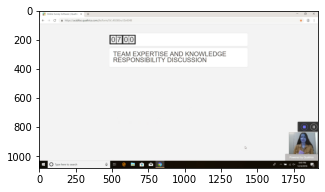

detect discussion:  130.90999348958331


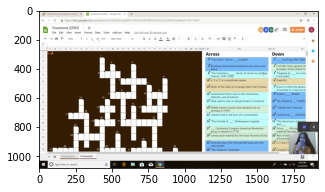

detect crossword:  721.68994140625
10000
20000
30000


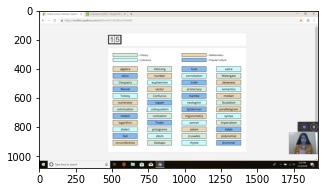

detect memory:  2519.0599772135415
235
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_04_2018/Webcam/GROUP3/OMEGA/S29G3B_Webcam_Omega.mp4
total 36014.0
start


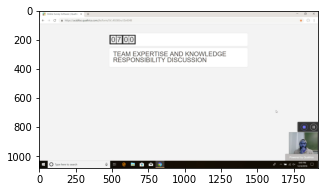

detect discussion:  155.699951171875
10000


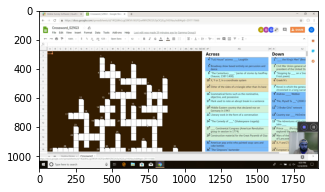

detect crossword:  747.8799641927083
20000
30000


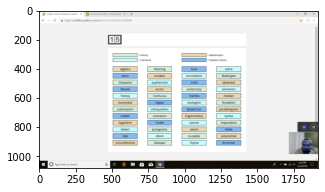

detect memory:  2461.420003255208
236
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP1/ALPHA/S30G1B_Webcam_Alpha.mp4
total 34040.0
start


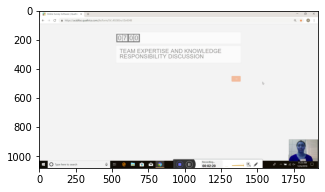

detect discussion:  140.81005859375


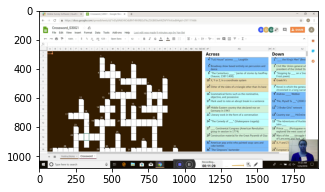

detect crossword:  690.2000325520833
10000
20000
30000


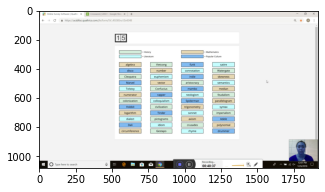

detect memory:  2437.8900553385415
237
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP1/BETA/S30G1B_Webcam_Beta.mp4
total 35696.0
start


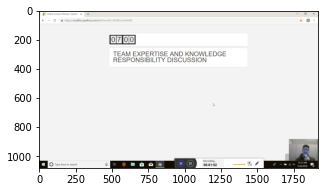

detect discussion:  112.53995768229166


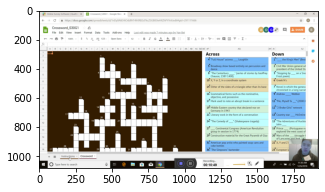

detect crossword:  650.1099446614583
10000
20000
30000


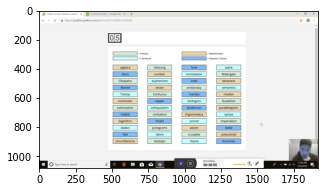

detect memory:  2335.25
238
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP1/GAMMA/S30G1B_Webcam_Gamma.mp4
total 35281.0
start


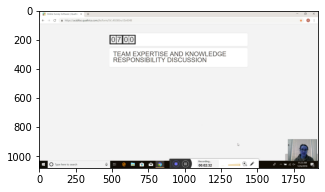

detect discussion:  152.40999348958331


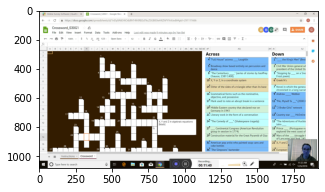

detect crossword:  700.4599609375
10000
20000
30000


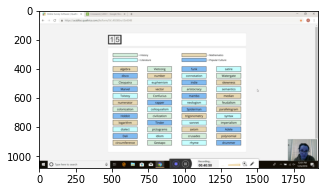

detect memory:  2451.3299967447915
239
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP1/OMEGA/S30G1B_WeBcam_Omega.mp4
total 35375.0
start


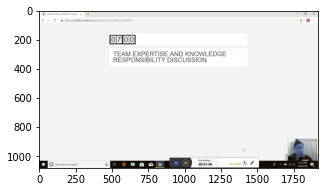

detect discussion:  106.10994466145833


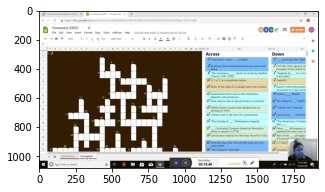

detect crossword:  646.8999837239583
10000
20000
30000


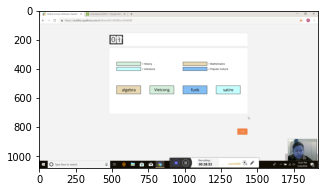

detect memory:  2333.5900065104165
240
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP3/ALPHA/S30G3B_Webcam_Alpha.mp4
total 35600.0
start


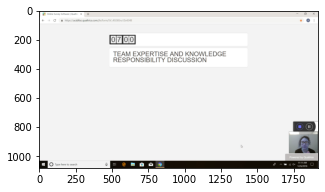

detect discussion:  116.75


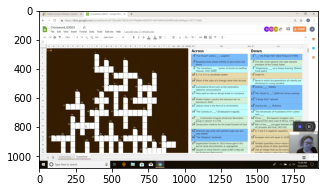

detect crossword:  640.0
10000
20000
30000


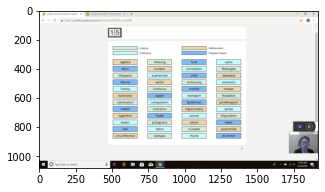

detect memory:  2342.379964192708
241
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP3/BETA/S30G3B_Webcam_Beta.mp4
total 35145.0
start


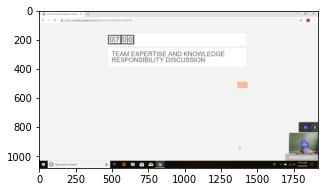

detect discussion:  187.14998372395831


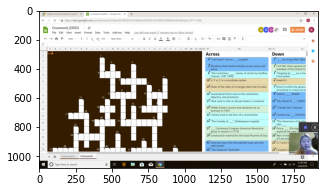

detect crossword:  712.3099772135416
10000
20000
30000


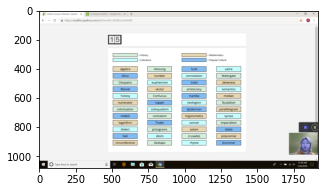

detect memory:  2418.099934895833
242
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP3/GAMMA/S30G3B_Webcam_Gamma.mp4
total 34186.0
start


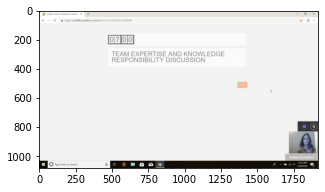

detect discussion:  136.84000651041666


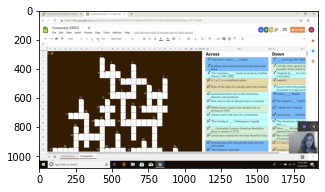

detect crossword:  661.6700032552083
10000
20000
30000


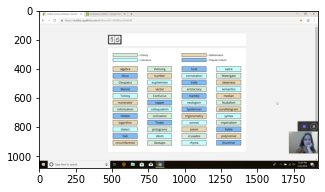

detect memory:  2361.989990234375
243
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP3/OMEGA/S30G3B_Webcam_Omega.mp4
total 35435.0
start


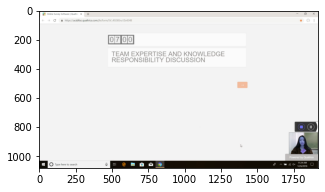

detect discussion:  162.89005533854166


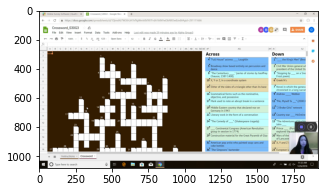

detect crossword:  687.280029296875
10000
20000
30000


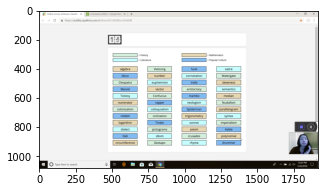

detect memory:  2393.3900553385415
244
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP1/ALPHA/S31G1B_Webcam_Alpha.mp4
total 33228.0
start


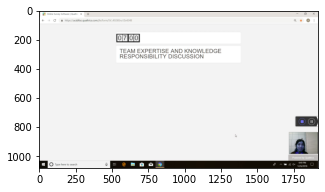

detect discussion:  96.719970703125


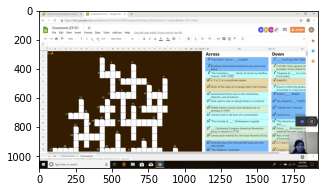

detect crossword:  673.6599934895833
10000
20000
30000


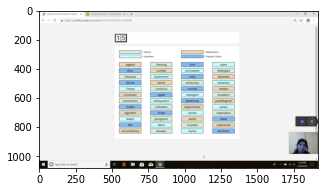

detect memory:  2419.409993489583
245
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP1/BETA/S31G1B_Webcam_Beta.mp4
total 37497.0
start


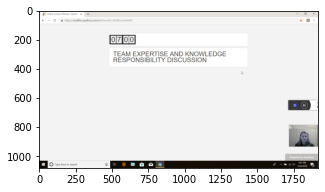

detect discussion:  169.34000651041666
10000


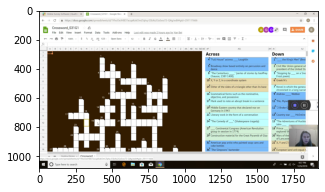

detect crossword:  753.2300618489583
20000
30000


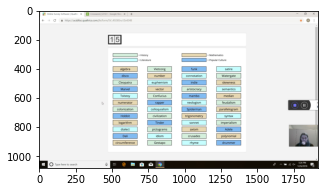

detect memory:  2496.950032552083
246
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP1/GAMMA/S31G1B_Webcam_Gamma.mp4
total 35916.0
start


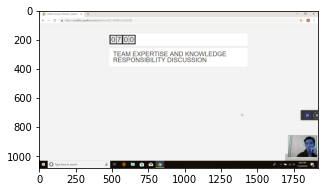

detect discussion:  116.68001302083333


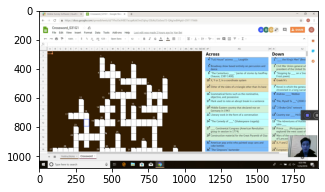

detect crossword:  699.0
10000
20000
30000


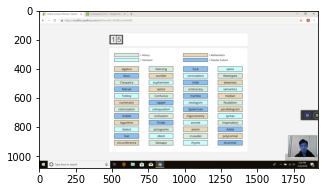

detect memory:  2439.5
247
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP1/OMEGA/S31G1B_Webcam_Omega.mp4
total 36790.0
start


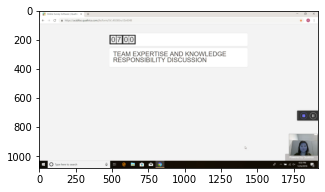

detect discussion:  126.61995442708333
10000


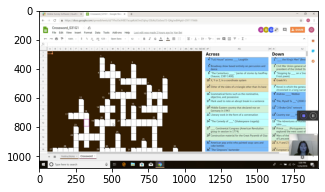

detect crossword:  720.8799641927083
20000
30000


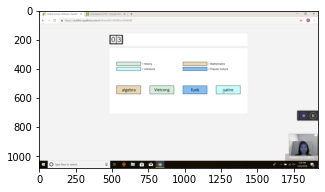

detect memory:  2396.510009765625
248
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP3/ALPHA/S31G3B_Webcam_Alpha.mp4
total 36086.0
start


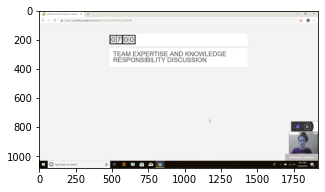

detect discussion:  115.97005208333333


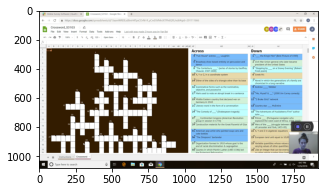

detect crossword:  681.800048828125
10000
20000
30000


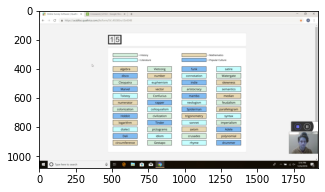

detect memory:  2407.200032552083
249
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP3/BETA/S31G3B_Webcam_Beta.mp4
total 35339.0
start


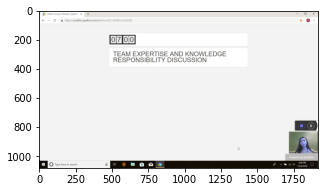

detect discussion:  184.65999348958331
10000


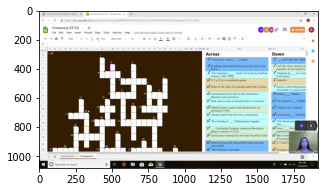

detect crossword:  760.760009765625
20000
30000


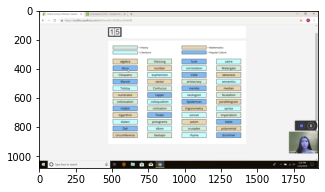

detect memory:  2475.3199869791665
250
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP3/GAMMA/S31G3B_Webcam_Gamma.mp4
total 34159.0
start


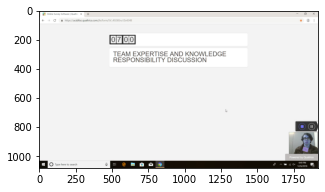

detect discussion:  137.7099609375


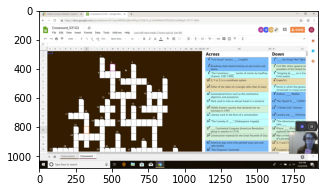

detect crossword:  713.7799479166666
10000
20000
30000


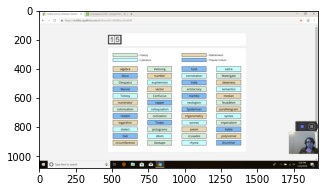

detect memory:  2421.9599609375
251
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/12_06_2018/Webcam/GROUP3/OMEGA/S31G3B_Webcam_Omega.mp4
total 35640.0
start


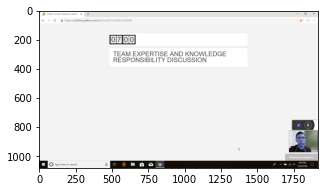

detect discussion:  145.429931640625


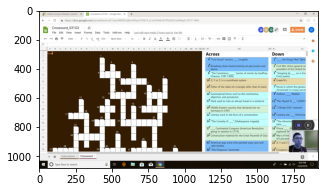

detect crossword:  730.969970703125
10000
20000
30000


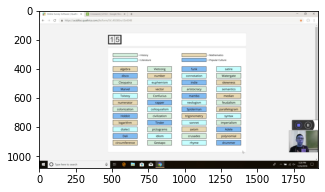

detect memory:  2453.659993489583
252
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/02_20_2019/Webcam/S32G1A_Webcam_Alpha.mp4
total 31015.0
start


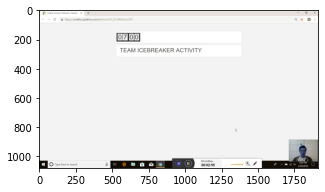

detect discussion:  175.75


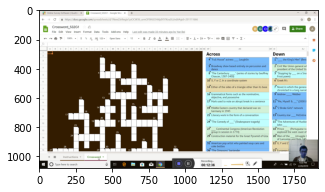

detect crossword:  756.8400065104166
10000
20000


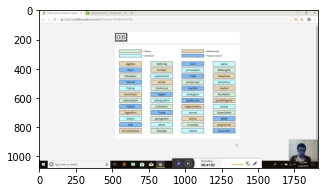

detect memory:  2463.219970703125
253
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/02_20_2019/Webcam/S32G1A_Webcam_Beta.mp4
total 38295.0
start


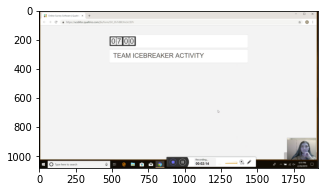

detect discussion:  134.64998372395831
10000


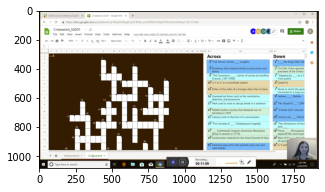

detect crossword:  719.5599772135416
20000
30000


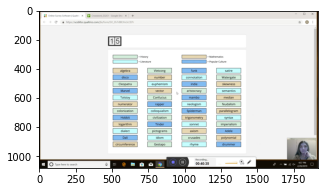

detect memory:  2435.670003255208
254
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/02_20_2019/Webcam/S32G1A_Webcam_Gamma.mp4
total 38564.0
start


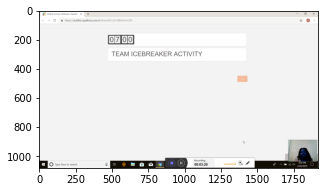

detect discussion:  201.05997721354166
10000


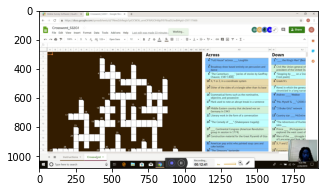

detect crossword:  761.6399739583333
20000
30000


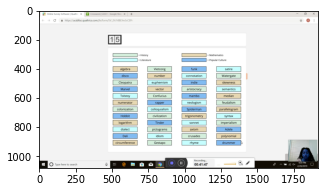

detect memory:  2507.3400065104165
255
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/02_20_2019/Webcam/S32G1A_Webcam_Omega.mp4
total 37683.0
start


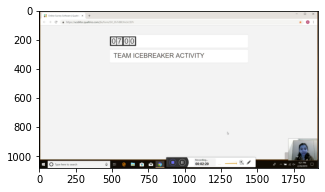

detect discussion:  140.96004231770831
10000


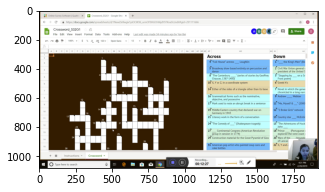

detect crossword:  747.9400227864583
20000
30000


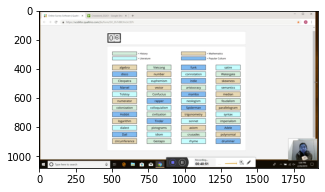

detect memory:  2452.0900065104165
256
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/02_20_2019/Webcam/S32G2A_Webcam_Alpha.mp4
total 35706.0
start


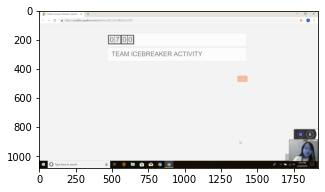

detect discussion:  100.969970703125


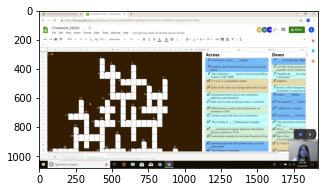

detect crossword:  650.0199381510416
10000
20000
30000


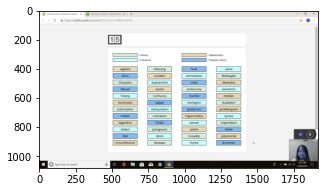

detect memory:  2372.670003255208
257
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/02_20_2019/Webcam/S32G2A_WEBCAM_BETA.mp4
total 35002.0
start


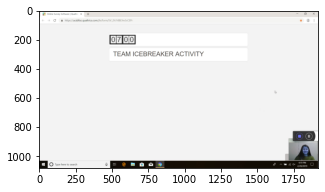

detect discussion:  183.75


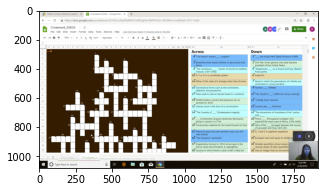

detect crossword:  724.1399739583333
10000
20000
30000


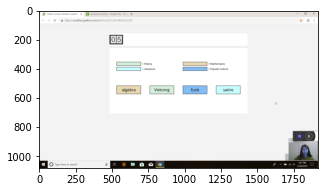

detect memory:  2457.619954427083
258
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/02_20_2019/Webcam/S32G2A_Webcam_Gamma.mp4
total 34813.0
start


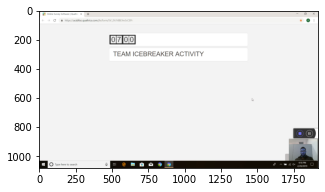

detect discussion:  124.78995768229166


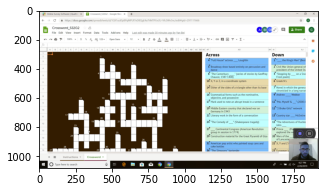

detect crossword:  669.1299641927083
10000
20000
30000


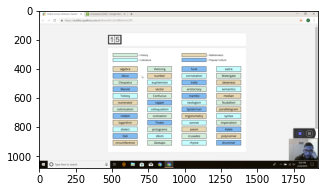

detect memory:  2469.129964192708
259
/content/drive/MyDrive/robot/vedioanalysis/Audio Video/02_20_2019/Webcam/S32G2A_WEBCAM_OMEGA.mp4
total 37082.0
start


In [ ]:
result = []
for idx in time_tb.index:
  if idx > 105:
    print(idx)
    groupcode = time_tb.GroupCode[idx]
    member = time_tb.IndivCode_2[idx]
    path = None
    for p in video_list:
      if (groupcode.lower() in p.lower()) and (member.lower() in p.lower()):
        path = p

    if path != None:
      print(path)
      res = process_video_text_all(path,1)
      result.append([idx,res])
      #if idx % 10 == 0:
      with open('/content/drive/MyDrive/robot/vedioanalysis/AU2Emotion/result_gettime_4', 'wb') as fp:
        pickle.dump(result, fp)
      fp.close()